In [4]:
import os
import time
import sys
import scipy
import glob
import importlib
import pandas as pd
import numpy as np
import matplotlib as mpl
mpl.use('nbagg')
import seaborn as sns
import pylab as pl

from datetime import datetime

In [5]:
# import some custom funcs
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import utils as util
import behavior as butil

In [6]:
util.set_sns_style(style='dark')
%matplotlib notebook

In [7]:
rootdir = util.get_rootdir()
rootdir

'/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data'

# paired experiments:  within animal, air, odor, reinforced

In [10]:
# root_dir = '/Users/julianarhee/Library/CloudStorage/GoogleDrive-edge.tracking.ru@gmail.com/My Drive/Edge_Tracking/Data'
rootdir = util.get_rootdir()
experiment = 'vertical_strip/paired_experiments'
src_dir = os.path.join(rootdir, experiment)

fig_id = os.path.join('/Edge_Tracking', rootdir.split('/Edge_Tracking/')[1], experiment)
print(fig_id)
savedir = '{}/jyr/{}'.format(rootdir, experiment)
savedir = savedir.replace(" ", "")
figdir = os.path.join(savedir, 'figures')
print("Saving figures to:{}    {}".format('\n', figdir))
if not os.path.exists(figdir):
    os.makedirs(figdir)

/Edge_Tracking/Data/vertical_strip/paired_experiments
Saving figures to:
    /home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures


In [12]:
# copy files?
copy_files=False
orig_log = glob.glob(os.path.join(src_dir, '*.log'))
copied_log = glob.glob(os.path.join(savedir, 'raw', '*.log'))
if len(orig_log)==0 and len(copied_log)==0:
    copy_files=True
    print("Need to copy files from orig loc to <{}>".format(os.path.join(savedir, 'raw')))
else:
    src_dir = os.path.join(savedir, 'raw')
    print("Found {} .log file in new src dir: {}".format(len(copied_log), src_dir))
if copy_files:
    import shutil
    for tmp_src in os.listdir(os.path.join(src_dir, 'multiple_reinforcement')):
        curr_logs = glob.glob(os.path.join(src_dir, 'multiple_reinforcement', tmp_src, '*.log'))
        for fn in curr_logs:
            fbase = os.path.split(fn)[-1]
            shutil.copy(fn, os.path.join(savedir, fbase))


Found 38 .log file in new src dir: /home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/raw


In [14]:
src_dir

'/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/raw'

In [16]:
log_files = sorted([k for k in glob.glob(os.path.join(src_dir, '*.log'))\
                if 'lossed tracking' not in k], key=util.natsort)
print("Found {} tracking files.".format(len(log_files)))

# for fi, fpath in enumerate(log_files):
#     dfn = os.path.split(fpath)[-1]
#     print(fi, dfn)

Found 38 tracking files.


In [216]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

Processing 38 tracking files.


<IPython.core.display.Javascript object>


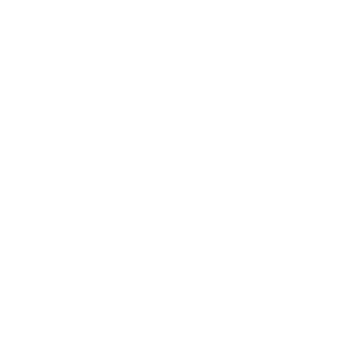

[WARNING] 07202020-193426_fly9_odor: Found bad skips, removing 40 of 20519 samples.
Correcting experiment conditions: vertical_strip/paired_experiments
Changing 1
Changing 1
Changing 1
Changing 1
Changing 1
Changing 1
Changing 1
Changing 1
Changing 1
Changing 1
Changing 1
Changing 1
Changing 1
Changing 1
Saving combined df to: /home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments
Found 4 conditions:
air
odor
reinforced
lightonly


In [17]:
strip_width=50
strip_sep=200
# is_csv = False
df0_all = butil.load_combined_df(log_files=log_files, logdf=None, 
                                is_csv=False, experiment=experiment, 
                                savedir=savedir, save_errors=True, create_new=True,
                                parse_filename=True, remove_invalid=True, process=True)
#df0_all = df0_all.rename(columns={'Unnamed: 0': 'frame'})
condition_list = df0_all['condition'].unique()
print("Found {} conditions:".format(len(condition_list)))
for c in condition_list:
    print(c)

In [220]:
# df0.loc[df0['condition']=='light', 'condition'] = 'lightonly'
# df0['condition'].unique()

# df_fpath = os.path.join(src_dir, 'combined_df.pkl')
# butil.save_df(df0, df_fpath)

## plot all conds

In [24]:
hue_varname='instrip'
palette={True: 'r', False: 'w'}
start_at_odor = True
strip_width=50
odor_lc='lightgray'
odor_lw=0.5

<IPython.core.display.Javascript object>


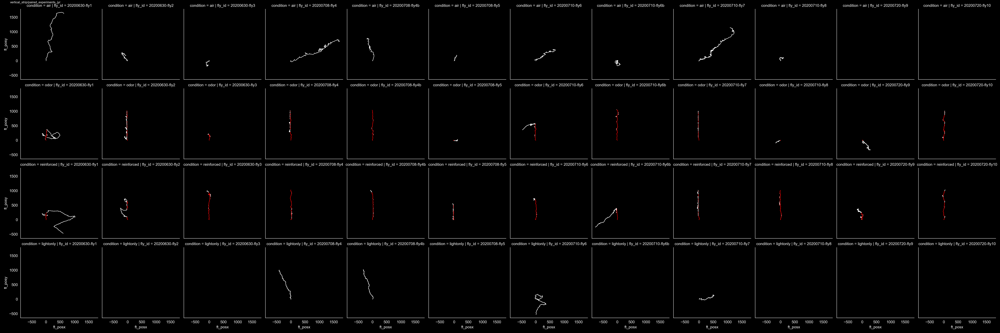

KeyError: '20200630-fly1'

In [231]:
conds=['air', 'odor', 'reinforced', 'lightonly']
plotdf = df0[df0['condition'].isin(conds)]
g = sns.FacetGrid(plotdf, col='fly_id', row='condition')
g.map_dataframe(sns.scatterplot, x="ft_posx", y="ft_posy", hue=hue_varname,
               s=0.5, edgecolor='none', palette=palette) #, palette=palette)
pl.show()
util.label_figure(g.fig, experiment)

# add odor corridor to facet grid
for (cond, fly_id), currdf in plotdf.groupby(['condition', 'fly_id']):
    cond_ix = conds.index(cond)
    fly_ix = fly_ids.index(fly_id)
    ax = g.axes[cond_ix, fly_ix]
    odor_xmin, odor_xmax = odor_borders[fly_id]
    butil.plot_odor_corridor(ax, odor_xmin=odor_xmin, odor_xmax=odor_xmax)

figname = 'allconds_by_fly'
pl.savefig(os.path.join(save_dir, '{}.png'.format(figname))) #, dpi=dpi)


In [23]:
conds = list(df0['condition'].unique())
fly_ids = sorted(list(df0['fly_id'].unique()), key=util.natsort)
print(fly_ids)

['20200630-fly1', '20200630-fly2', '20200630-fly3', '20200708-fly4', '20200708-fly4b', '20200708-fly5', '20200710-fly6', '20200710-fly6b', '20200710-fly7', '20200710-fly8', '20200720-fly9', '20200720-fly10']


In [26]:
if not os.path.exists(os.path.join(figdir, 'individuals')):
    os.makedirs(os.path.join(figdir, 'individuals'))

20200630-fly1 ['air' 'odor' 'reinforced']


/tmp/ipykernel_1195036/205548547.py:2: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for fly_id, df_ in df0_all.groupby(['fly_id']):


<IPython.core.display.Javascript object>


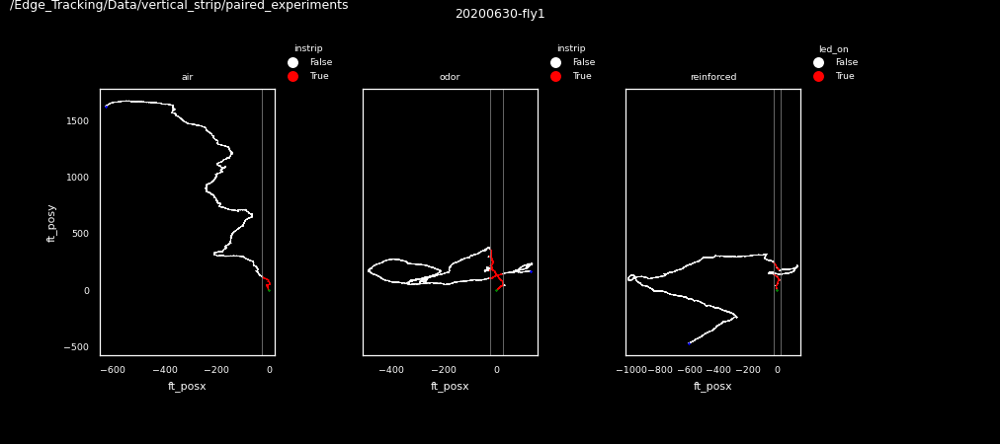

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200630-fly1
20200630-fly2 ['air' 'odor' 'reinforced']


<IPython.core.display.Javascript object>


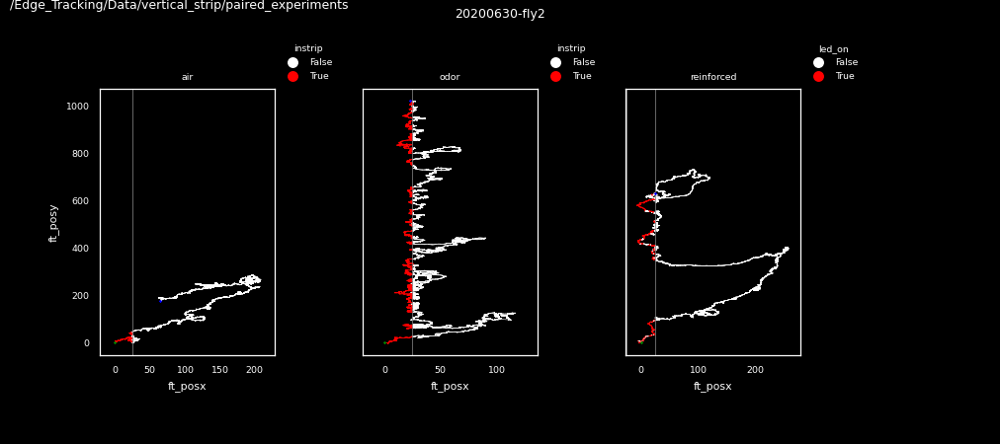

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200630-fly2
20200630-fly3 ['air' 'odor' 'reinforced']


<IPython.core.display.Javascript object>


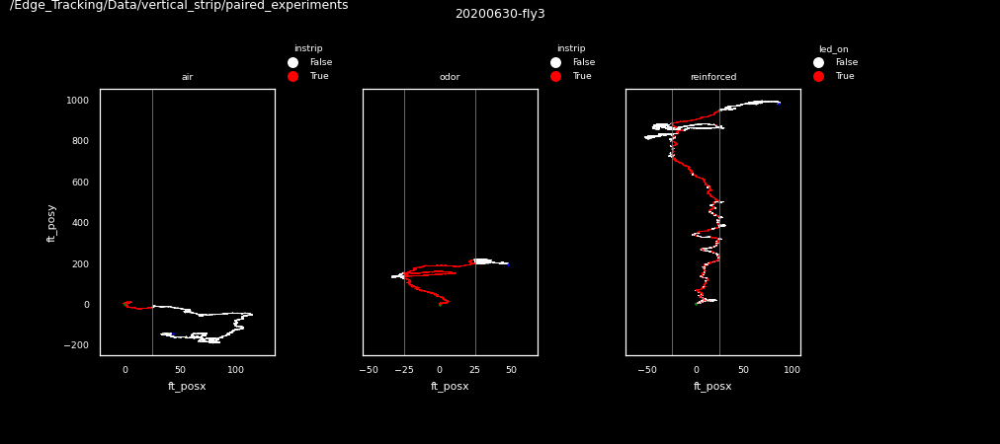

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200630-fly3
20200708-fly4 ['lightonly' 'air' 'odor' 'reinforced']


<IPython.core.display.Javascript object>


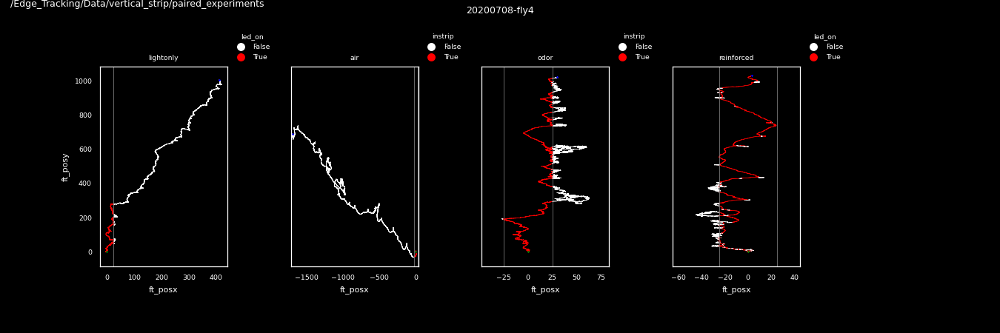

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200708-fly4
20200708-fly4b ['air' 'odor' 'reinforced' 'lightonly']


<IPython.core.display.Javascript object>


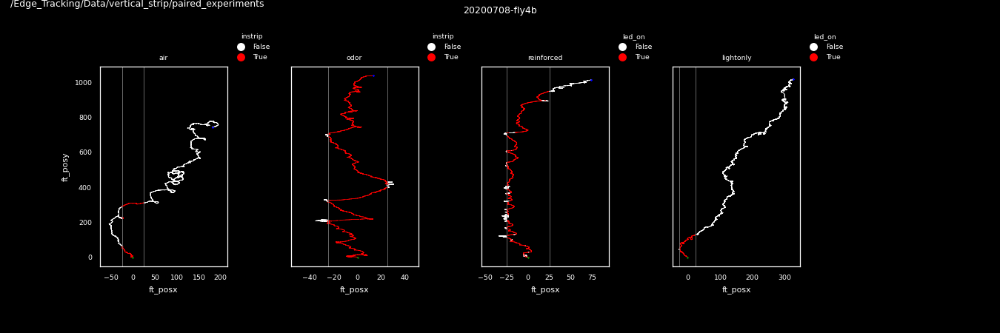

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200708-fly4b
20200708-fly5 ['air' 'odor' 'reinforced']


<IPython.core.display.Javascript object>


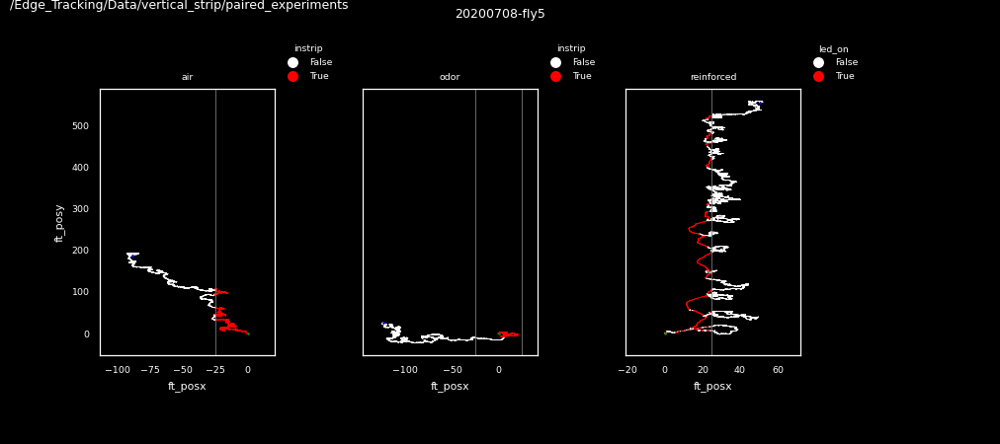

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200708-fly5
20200710-fly6 ['air' 'odor' 'reinforced' 'lightonly']


<IPython.core.display.Javascript object>


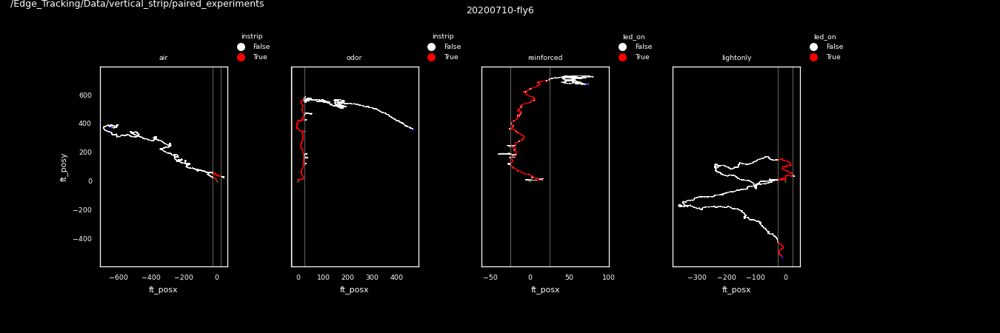

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200710-fly6
20200710-fly6b ['air' 'odor' 'reinforced']


<IPython.core.display.Javascript object>


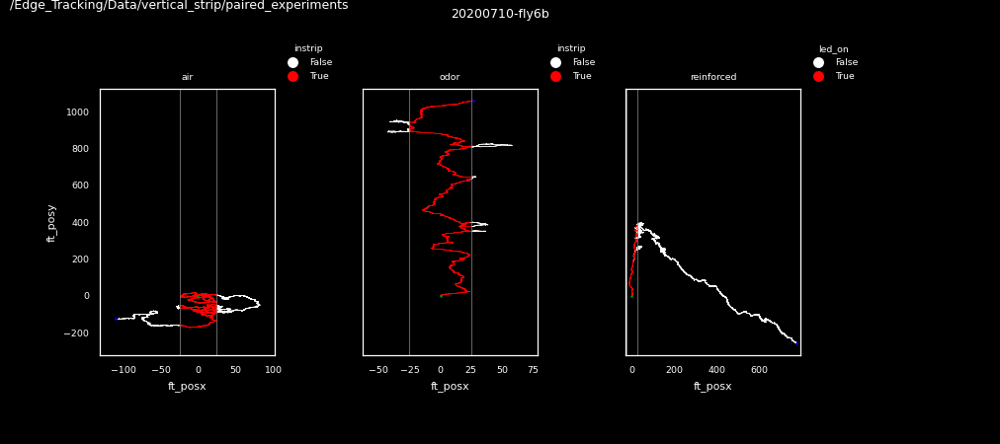

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200710-fly6b
20200710-fly7 ['air' 'odor' 'reinforced' 'lightonly']


<IPython.core.display.Javascript object>


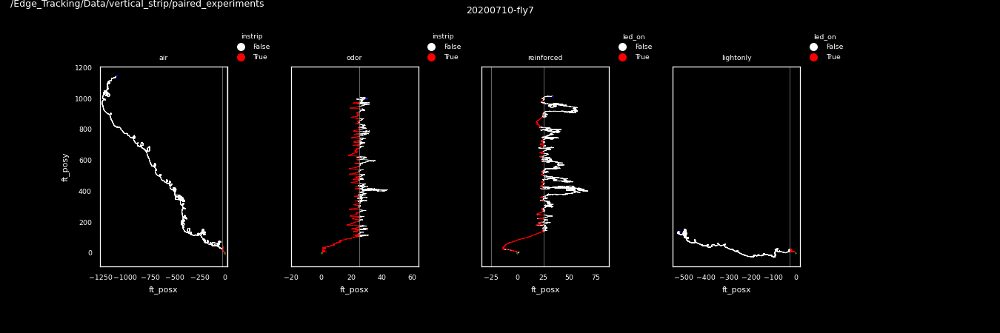

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200710-fly7
20200710-fly8 ['air' 'odor' 'reinforced']


<IPython.core.display.Javascript object>


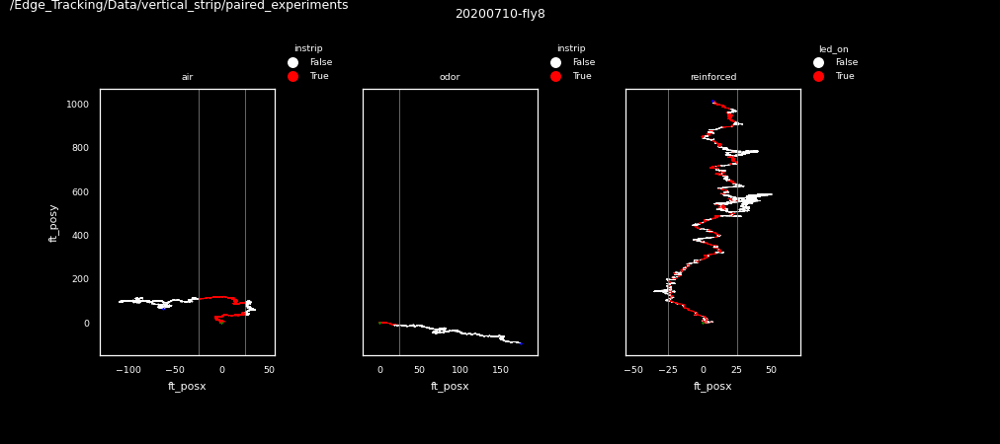

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200710-fly8
20200720-fly10 ['odor' 'reinforced']


<IPython.core.display.Javascript object>


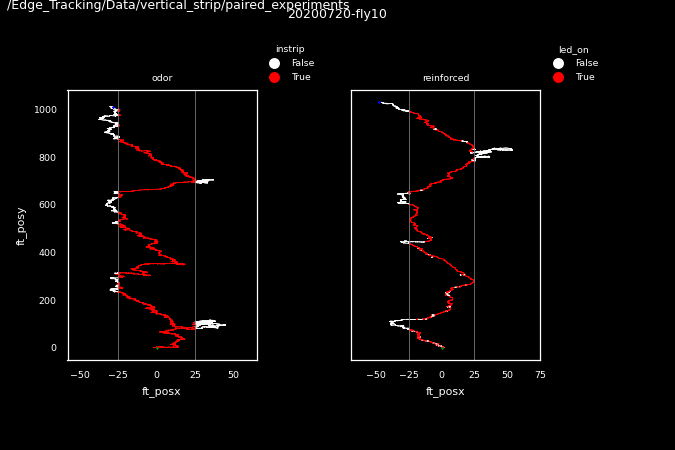

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200720-fly10
20200720-fly9 ['odor' 'reinforced']


<IPython.core.display.Javascript object>


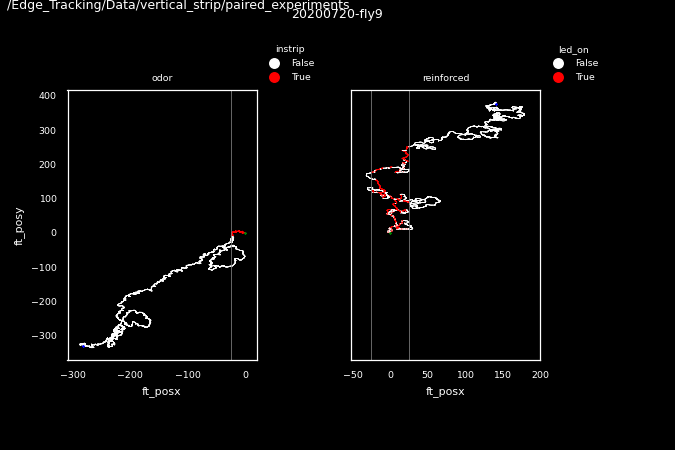

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_20200720-fly9


In [43]:
# add odor corridor to facet grid
for fly_id, df_ in df0_all.groupby(['fly_id']):
    #if fly_id in excl_flies:
    #    print("EXCL", fly_id)
    #    continue
    conds = df_['condition'].unique()
    print(fly_id, conds)
    nc = len(conds)
    fig, axn = pl.subplots(1, nc, figsize=(nc*3, 4), sharex=False, sharey=True)
    for ai, (ax, cond) in enumerate(zip(fig.axes, conds)):
        currdf = df_[df_['condition']==cond].copy()
        odor_xmin, odor_xmax = (-25, 25) #odor_borders[fly_id]
        try:
            if cond in ['reinforced', 'lightonly']:
                butil.plot_trajectory(currdf, odor_bounds=[(odor_xmin, odor_xmax)], 
                              hue_varname='led_on', ax=ax, start_size=1, markersize=0.25, legend_loc='lower left')
            else:
                butil.plot_trajectory(currdf, odor_bounds=[(odor_xmin, odor_xmax)], 
                              hue_varname='instrip', ax=ax, start_size=1, markersize=0.25, legend_loc='lower left')
        except ValueError:
            continue
        ax.set_title(cond, fontsize=6)
        #ax.legend(bbox_to_anchor=(1,1), loc='lower left')
        #butil.plot_odor_corridor(ax, odor_xmin=odor_xmin, odor_xmax=odor_xmax)
    pl.subplots_adjust(bottom=0.2, right=0.8, top=0.8, wspace=0.5, left=0.1)
    fig.suptitle(fly_id, fontsize=8)
    util.label_figure(fig, fig_id)
    figname = 'traj_{}'.format(fly_id)
    pl.savefig(os.path.join(figdir, 'individuals', '{}.png'.format(figname)))
    print(figdir, figname)

## odor v reinforced only

In [127]:
condition_list = ['odor', 'reinforced']
df0 = df0_all[df0_all['condition'].isin(condition_list)].copy()


In [20]:
odor_cond = None
strip_width=50
odor_borders = butil.get_odor_grid_all_flies(df0, strip_width=strip_width)
# for trial_id, currdf in df0.groupby(['trial_id']):
#     ogrid, in_odor = butil.get_odor_grid(currdf, strip_width=strip_width, #strip_sep=2000,
#                                 use_crossings=True, verbose=False)
#     if not in_odor:
#         print(trial_id, "WARNING: Fly never in odor (cond={})".format(currdf['condition'].unique()))
#     (odor_xmin, odor_xmax), = ogrid.values()
#     odor_borders.update({trial_id: (odor_xmin, odor_xmax)})

/home/julianarhee/Repositories/plume-tracking/behavior.py:1394: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for trial_id, currdf in df0.groupby(['trial_id']):


#### plot

<IPython.core.display.Javascript object>


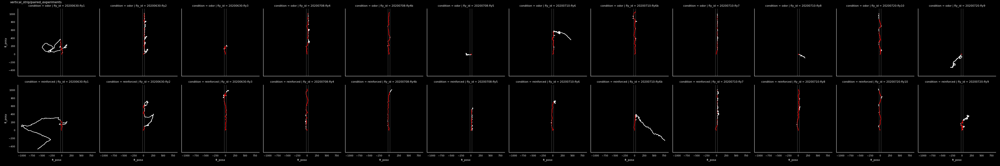

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/vertical_strip/paired_experiments/figures traj_all_odor-reinforced


In [25]:
# xmin, xmax = (-500, 500)
# ymin, ymax = (-100, 1000)
# odor_xmin, odor_xmax = (-100, 100)
#conds=['reinforced']
plotdf = df0.copy() #df0[df0['condition'].isin(conds)]
g = sns.FacetGrid(plotdf, col='fly_id', row='condition')
g.map_dataframe(sns.scatterplot, x="ft_posx", y="ft_posy", hue=hue_varname,
               s=0.5, edgecolor='none', palette=palette, alpha=0.7) #, palette=palette)
pl.show()
util.label_figure(g.fig, experiment)

# add odor corridor to facet grid
for (cond, fly_id), currdf in plotdf.groupby(['condition', 'fly_id']):
    cond_ix = conds.index(cond)
    fly_ix = fly_ids.index(fly_id)
    ax = g.axes[cond_ix, fly_ix]
    odor_xmin, odor_xmax = (-25, 25) #odor_borders[fly_id]
    butil.plot_odor_corridor(ax, odor_xmin=odor_xmin, odor_xmax=odor_xmax)

figname = 'traj_all_{}'.format('-'.join(conds))
pl.savefig(os.path.join(figdir, '{}.png'.format(figname))) #, dpi=dpi)
print(figdir, figname)

## get flies that track in ODOR cond 

In [52]:
et_flies = []
for fly_id, df_ in df0[df0['condition']=='odor'].groupby('fly_id'):
    is_et = butil.is_edgetracking(df_, strip_width=strip_width)
    print(fly_id, cond, is_et)
    if is_et:
        et_flies.append(fly_id)
et_flies = np.unique(et_flies)

20200630-fly1 reinforced False
20200630-fly2 reinforced True
20200630-fly3 reinforced False
20200708-fly4 reinforced True
20200708-fly4b reinforced False
20200708-fly5 reinforced False
20200710-fly6 reinforced True
20200710-fly6b reinforced True
20200710-fly7 reinforced True
20200710-fly8 reinforced False
20200720-fly10 reinforced True
20200720-fly9 reinforced False


/home/julianarhee/Repositories/plume-tracking/behavior.py:979: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  upwind_dists = curr_bouts.groupby('boutnum').apply(lambda x: x['ft_posy'].max() - x['ft_posy'].min())


In [59]:
df = df0[df0['fly_id'].isin(et_flies)].copy()

<IPython.core.display.Javascript object>


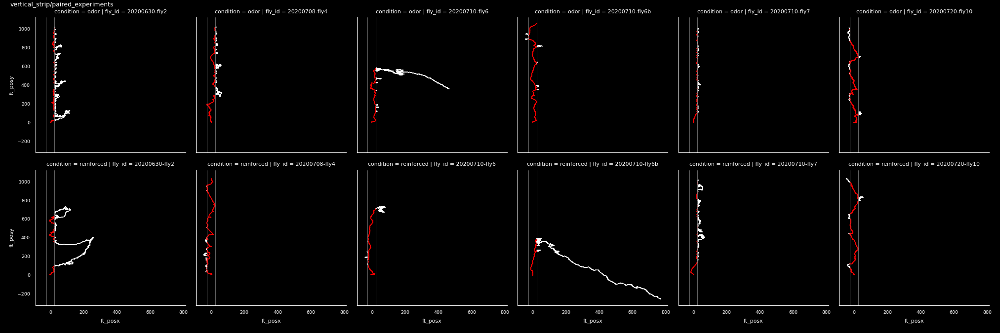

In [62]:
curr_conds=[ 'odor', 'reinforced']
plotdf = df[df['condition'].isin(curr_conds)]
g = sns.FacetGrid(plotdf, col='fly_id', row='condition')
g.map_dataframe(sns.scatterplot, x="ft_posx", y="ft_posy", hue=hue_varname,
               s=0.5, edgecolor='none', palette=palette) #, palette=palette)
pl.show()
util.label_figure(g.fig, experiment)

curr_flies = sorted(plotdf['fly_id'].unique())
# add odor corridor to facet grid
for (cond, fly_id), currdf in plotdf.groupby(['condition', 'fly_id']):
    cond_ix = curr_conds.index(cond)
    fly_ix = curr_flies.index(fly_id)
    ax = g.axes[cond_ix, fly_ix]
    [(odor_xmin, odor_xmax)] = butil.find_strip_borders(currdf)
    butil.plot_odor_corridor(ax, odor_xmin=odor_xmin, odor_xmax=odor_xmax)

figname = 'allconds_ET'
pl.savefig(os.path.join(figdir, '{}.png'.format(figname))) #, dpi=dpi)


## check reinforcement

#### compare MFC and LED values?

In [24]:
%matplotlib notebook

# Parse bouts
Exclude the last bout if it is outstrip (trial done bec animal wanders off)

#### check smoothing

In [122]:
fly_id = '20200710-fly7'
curr_cond = 'odor'
df_ = df[(df['fly_id']==fly_id)].copy()

In [123]:
importlib.reload(butil)

<module 'behavior' from '/home/julianarhee/Repositories/plume-tracking/behavior.py'>

In [124]:
df_ = butil.process_df(df_, smooth=True)

<IPython.core.display.Javascript object>


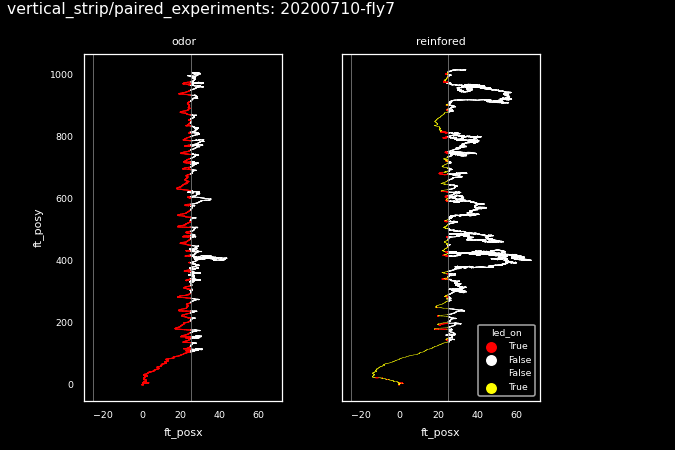

In [125]:
# fly_id = 'fly7'
# df_ = df[(df['fly_id']==fly_id)].copy()
# 
figlabel_fly = '{}: {}'.format(experiment, fly_id)
led_palette={False: 'none', True: 'yellow'}
instrip_palette_masked={0: 'w', 1:'r', None: 'none'}
instrip_palette={0: 'w', 1:'r'}

# -----------------------------------------------------------------
fig, axes = pl.subplots(1,2, sharex=True, sharey=True)
ax=axes[0]; ax.set_title('odor')
sns.scatterplot(data=df_[df_['condition']=='odor'], x="ft_posx", y="ft_posy", hue='instrip',
               s=0.5, edgecolor='none', palette=instrip_palette, ax=ax)
[(odor_xmin, odor_xmax)] = butil.find_strip_borders(df_[df_['condition']=='odor'])
ax.legend_.remove()

ax=axes[1]; ax.set_title('reinfored')
masked_ = df_[df_['condition']=='reinforced'].copy()
masked_.loc[(masked_['led_on']), 'instrip'] = None
sns.scatterplot(data=masked_, x="ft_posx", y="ft_posy", hue='instrip',
               s=0.5, edgecolor='none', palette=instrip_palette_masked, ax=ax)
sns.scatterplot(data=df_[df_['condition']=='reinforced'], x="ft_posx", y="ft_posy", hue='led_on',
               s=0.1, edgecolor='none', palette=led_palette, ax=ax) #, palette=palette)
[(odor_xmin, odor_xmax)] = butil.find_strip_borders(df_[df_['condition']=='reinforced'])

for ax in axes:
    butil.plot_odor_corridor(ax, odor_xmin=odor_xmin, odor_xmax=odor_xmax)
pl.subplots_adjust(wspace=0.3, right=0.8)
fig.text(0.01, 0.97,figlabel_fly)

figpath = os.path.join(figdir, 'individuals', '{}_odor_v_reinforced_traj.png'.format(fly_id))
pl.savefig(figpath)

In [780]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

In [128]:
xvar='ft_posx'
yvar='ft_posy'
conditions=['odor', 'reinforced']
df = df0[df0['condition'].isin(conditions)].copy()
bout_thresh=0.5

DF = butil.process_df(df0.copy(), smooth=True, fliplr=False)

# dlist=[]
# for (fly_id, cond), df_ in df.groupby(['fly_id', 'condition']):
#     for varname in ['ft_posx', 'ft_posy']:
#         df_ = butil.smooth_traces(df_, varname=varname, window_size=101)
#     # parse in and out bouts
#     df_ = butil.parse_bouts(df_, count_varname='instrip', bout_varname='boutnum') # 1-count
#     # filter in and out bouts by min. duration 
#     df_ = butil.filter_bouts_by_dur(df_, bout_thresh=bout_thresh, 
#                         bout_varname='boutnum', count_varname='instrip', verbose=False)
#     df_ = butil.calculate_speed(df_, xvar=xvar, yvar=yvar) # smooth=False, window_size=11, return_same=True)
#     df_ = butil.calculate_distance(df_, xvar=xvar, yvar=yvar)
#     dlist.append(df_)
# DF=pd.concat(dlist, axis=0).reset_index(drop=True)

#### per-bout calculations

In [268]:
dlist=[]
for bi, ((fly_id, cond, boutnum), b_) in enumerate(DF.groupby(['fly_id', 'condition', 'boutnum'])):
    # remove last bout if just fly wandering away
    if boutnum == DF[(DF['fly_id']==fly_id) & (DF['condition']==cond)]['boutnum'].max() \
        and b_['instrip'].unique()[0]==False:
        #print("{}, {} - skipping last bout".format(fly_id, cond))
        continue
    dlist.append(b_)
df_e = pd.concat(dlist, axis=0).reset_index()

In [269]:
figlabel_fly

'vertical_strip/paired_experiments: 20200720-fly9'

/tmp/ipykernel_1195036/3877737565.py:4: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for fly_id, df_ in DF.groupby(['fly_id']):


<IPython.core.display.Javascript object>


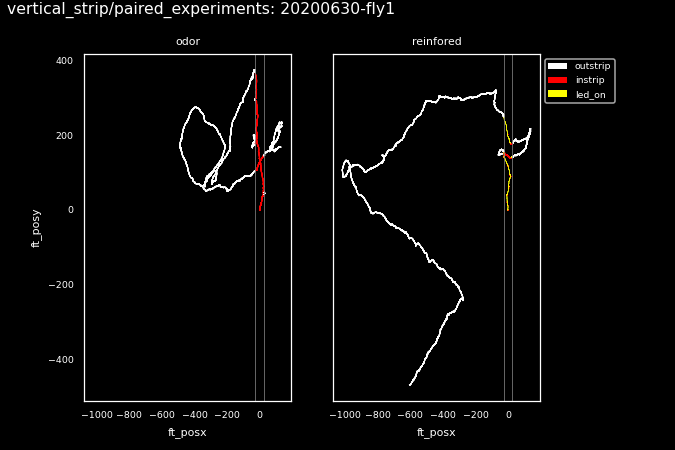

<IPython.core.display.Javascript object>


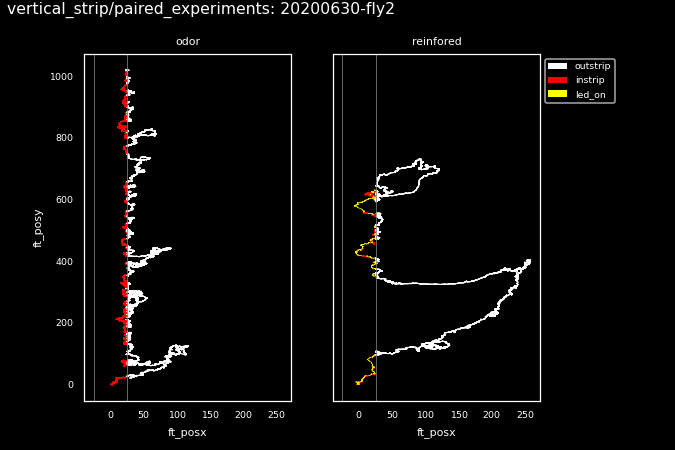

<IPython.core.display.Javascript object>


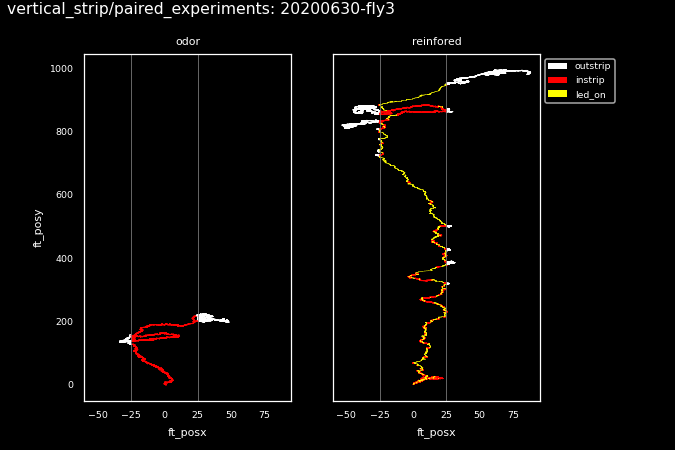

/tmp/ipykernel_1195036/3877737565.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = pl.subplots(1,2, sharex=True, sharey=True)


<IPython.core.display.Javascript object>


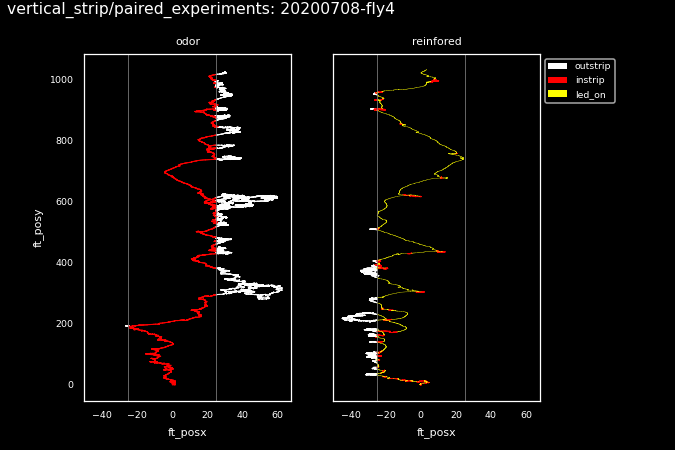

<IPython.core.display.Javascript object>


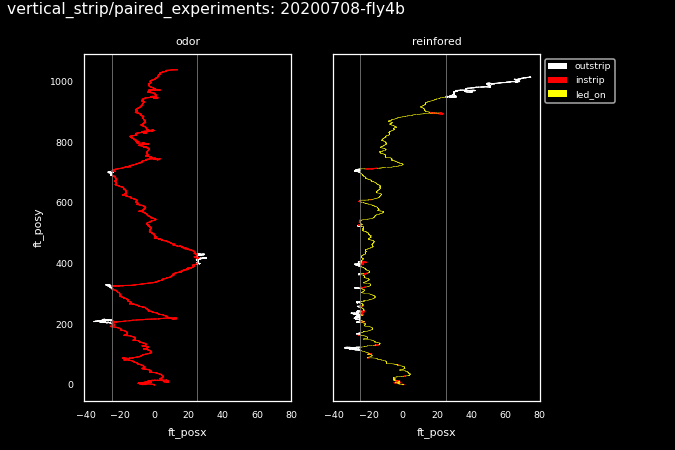

<IPython.core.display.Javascript object>


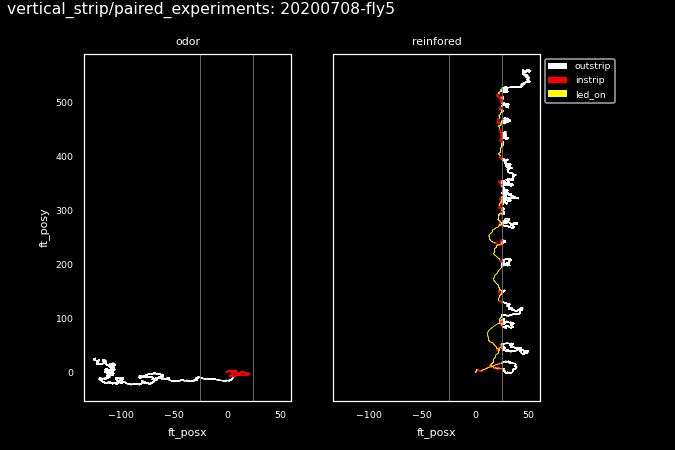

<IPython.core.display.Javascript object>


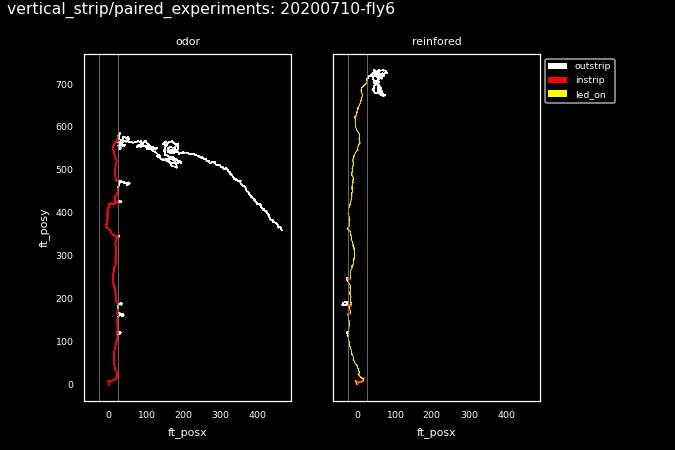

<IPython.core.display.Javascript object>


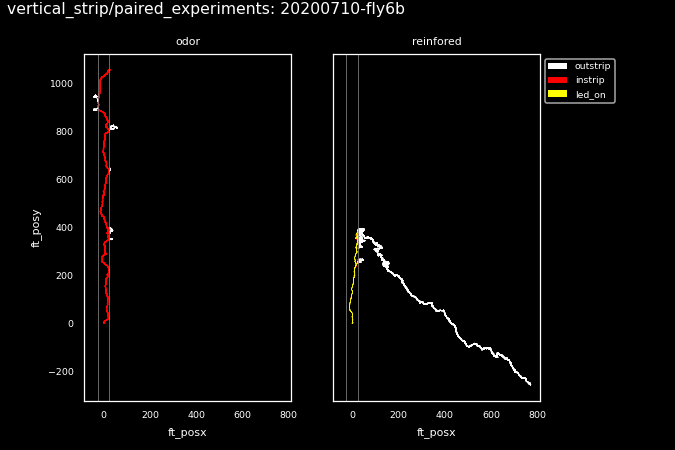

<IPython.core.display.Javascript object>


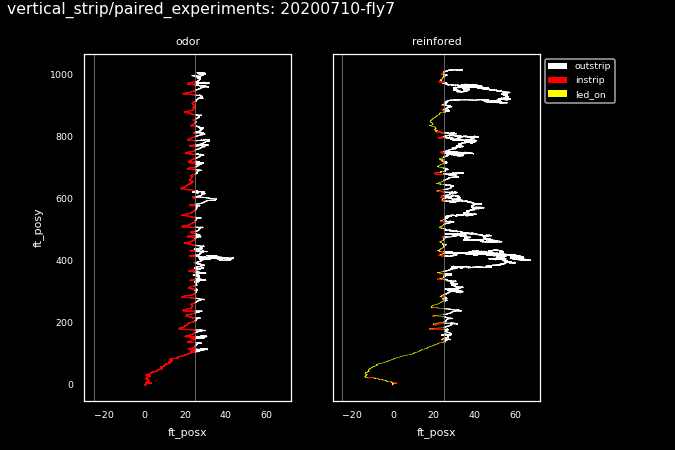

<IPython.core.display.Javascript object>


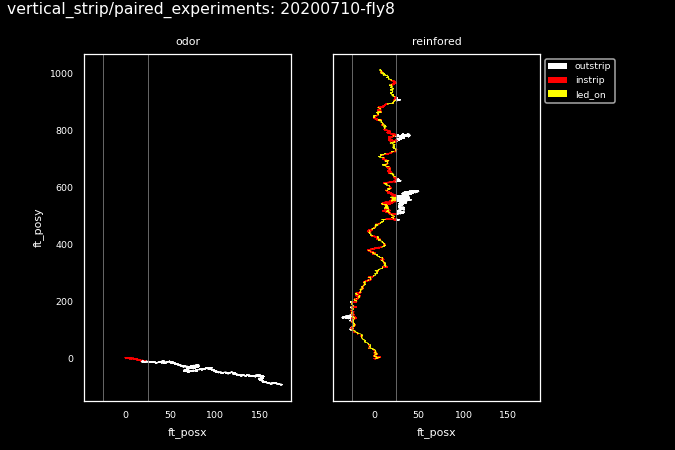

<IPython.core.display.Javascript object>


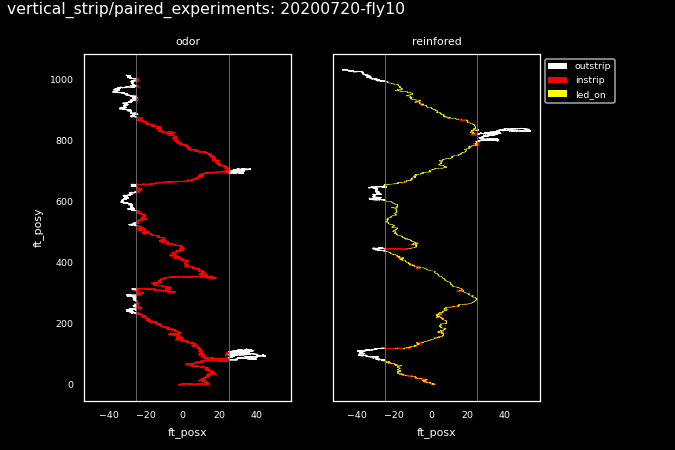

<IPython.core.display.Javascript object>


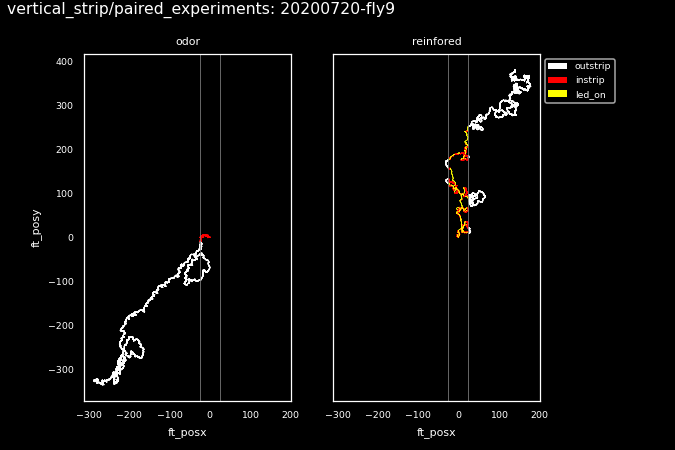

In [270]:
led_palette={False: 'none', True: 'yellow'}
instrip_palette_masked={0: 'w', 1:'r', None: 'none'}
instrip_palette={0: 'w', 1:'r'}
for fly_id, df_ in DF.groupby(['fly_id']):
    fig, axes = pl.subplots(1,2, sharex=True, sharey=True)
    ax=axes[0]; ax.set_title('odor')
    sns.scatterplot(data=df_[df_['condition']=='odor'], x="ft_posx", y="ft_posy", hue='instrip',
                   s=0.5, edgecolor='none', palette=instrip_palette, ax=ax)
    [(odor_xmin, odor_xmax)] = butil.find_strip_borders(df_[df_['condition']=='odor'])
    ax.legend_.remove()

    ax=axes[1]; ax.set_title('reinfored')
    masked_ = df_[df_['condition']=='reinforced'].copy()
    masked_.loc[(masked_['led_on']), 'instrip'] = None
    sns.scatterplot(data=masked_, x="ft_posx", y="ft_posy", hue='instrip',
                   s=0.5, edgecolor='none', palette=instrip_palette_masked, ax=ax)
    sns.scatterplot(data=df_[df_['condition']=='reinforced'], x="ft_posx", y="ft_posy", hue='led_on',
                   s=0.1, edgecolor='none', palette=led_palette, ax=ax) #, palette=palette)
    [(odor_xmin, odor_xmax)] = butil.find_strip_borders(df_[df_['condition']=='reinforced'])

    for ax in axes:
        butil.plot_odor_corridor(ax, odor_xmin=odor_xmin, odor_xmax=odor_xmax)
    pl.subplots_adjust(wspace=0.3, right=0.8)
    figlabel_fly = '{}: {}'.format(experiment, fly_id)
    fig.text(0.01, 0.97,figlabel_fly)

    legh = [mpl.patches.Patch(facecolor=v, edgecolor='none', label='instrip' if k==1 else 'outstrip') for k, v in instrip_palette.items()]
    legh.append(mpl.patches.Patch(facecolor='yellow', edgecolor='none', label='led_on'))
    ax.legend(handles=legh, bbox_to_anchor=(1,1), loc='upper left')
    pl.subplots_adjust(wspace=0.2, right=0.8)
    pl.savefig(os.path.join(figdir, 'individuals', '{}_odor-v-reinforce.png'.format(fly_id)))

In [273]:
xvar = 'smoothed_ft_posx'
yvar = 'smoothed_ft_posy'
df_e['abs_dist_to_edge'] = None
df_e['ix_in_bout'] = None
df_e['ft_posy_norm'] = None
dlist=[]
for bi, ((fly_id, cond, boutnum), b_) in enumerate(df_e.groupby(['fly_id', 'condition', 'boutnum'])):
    if boutnum ==1:
        continue
    # get borders
    [(odor_xmin, odor_xmax)] = butil.find_strip_borders(df_e[(df_e['fly_id']==fly_id) & (df_e['condition']==cond)])
    # calculate metrics
    total_dist = np.nansum(np.linalg.norm(b_[[xvar, yvar]].diff(axis=0), axis=1))
    assert len(b_['instrip'].unique())==1, "Too many instrip values"
    if b_['ft_posx'].iloc[-5:].mean() < 0: # on left edge
        farthest_pt = b_[xvar].min() if b_['instrip'].unique()[0]==False else b_[xvar].max()
        ypos_at_pt = b_.loc[b_[xvar].idxmin()][yvar] if b_['instrip'].unique()[0]==False \
                            else b_.loc[b_[xvar].idxmax()][yvar]
    else:
        farthest_pt = b_[xvar].min() if b_['instrip'].unique()[0]==True else b_[xvar].max()
        ypos_at_pt = b_.loc[b_[xvar].idxmin()][yvar] if b_['instrip'].unique()[0]==True \
                            else b_.loc[b_[yvar].idxmax()][yvar]
    df_e.loc[b_.index, 'ix_in_bout'] = np.arange(0, b_.shape[0])
    df_e.loc[b_.index, 'ft_posy_norm'] = b_[yvar] - b_[yvar].iloc[0] 
    df_e.loc[b_.index, 'abs_dist_to_edge'] = abs( odor_xmax - abs(b_[xvar]) )
    df_= pd.DataFrame({
        'start_t': b_.iloc[0]['time'],
        'end_t': b_.iloc[-1]['time'],
        'total_dist': np.nansum(b_['euclid_dist']),
        'elapsed_t': b_.iloc[-1]['time']-b_.iloc[0]['time'],
        'fly_id': fly_id, 
        'condition': cond,
        'boutnum': boutnum,
        'instrip': b_['instrip'].unique()[0],
        'total_dist': total_dist,
        'upwind_dist': np.nansum(b_['upwind_dist']),
        'crosswind_dist': np.nansum(b_['crosswind_dist']),
        'elapsed_t': b_.iloc[-1]['time']-b_.iloc[0]['time'],
        'max_xpos': farthest_pt, 
        'ypos_at_max_xpos': ypos_at_pt,
        'abs_dist_to_edge': abs( odor_xmax - abs(farthest_pt) ),
        'speed': np.nanmean(b_['speed']),
        'crosswind_speed': np.nanmean(b_['crosswind_speed']),
        'upwind_speed': np.nanmean(b_['upwind_speed'])
    }, index=[bi])
    dlist.append(df_)
boutdf = pd.concat(dlist, axis=0)
# df_e = pd.concat(dlist2, axis=0)

... Using default odor min/max, animal 20200710-fly8 did not move in odor
... Using default odor min/max, animal 20200710-fly8 did not move in odor


# Distance to edge
Does animal venture less far out if reinforced?

<IPython.core.display.Javascript object>


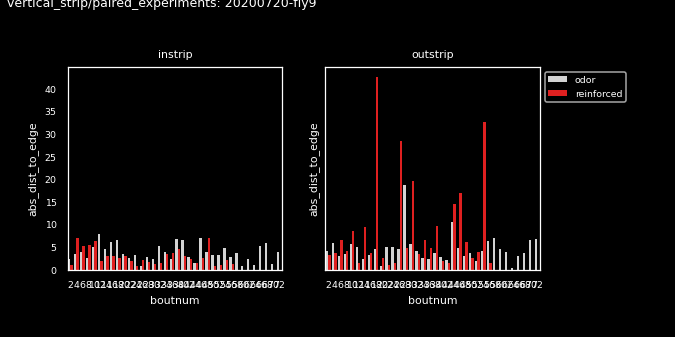

In [274]:
fly_id='20200710-fly7'
bdf_ = boutdf[boutdf['fly_id']==fly_id].copy()
# --------------------------------------------------------------
yvar='abs_dist_to_edge'
xvar='boutnum'
reinforced_palette={'odor': 'lightgray', 'reinforced': 'red'}
# --------------------------------------------------------------
fig, axes = pl.subplots(1, 2, figsize=(6,3), sharex=True, sharey=True)
ax=axes[0]; ax.set_title("instrip")
sns.barplot(data=bdf_[bdf_['instrip']], x=xvar, y=yvar, ax=ax, 
                hue='condition', palette=reinforced_palette, edgecolor='none') #=None)
ax.legend_.remove()
ax=axes[1]; ax.set_title("outstrip")
sns.barplot(data=bdf_[~bdf_['instrip']], x=xvar, y=yvar, ax=ax,
                hue='condition', palette=reinforced_palette, edgecolor='none')
ax.legend(bbox_to_anchor=(1,1), loc='upper left')

pl.subplots_adjust(left=0.1,wspace=0.2, right=0.8, bottom=0.2, top=0.8)
util.label_figure(fig, figlabel_fly)
pl.savefig(os.path.join(figdir, '{}_odor_v_reinforced_{}.png'.format(fly_id, yvar)))

<IPython.core.display.Javascript object>


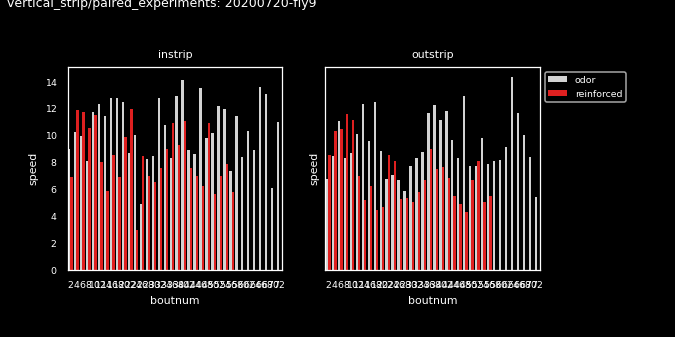

In [275]:
fly_id='20200710-fly7'
bdf_ = boutdf[boutdf['fly_id']==fly_id].copy()
# --------------------------------------------------------------
yvar='speed'
xvar='boutnum'
reinforced_palette={'odor': 'lightgray', 'reinforced': 'red'}
# --------------------------------------------------------------
fig, axes = pl.subplots(1, 2, figsize=(6,3), sharex=True, sharey=True)
ax=axes[0]; ax.set_title("instrip")
sns.barplot(data=bdf_[bdf_['instrip']], x=xvar, y=yvar, ax=ax, 
                hue='condition', palette=reinforced_palette, edgecolor='none') #=None)
ax.legend_.remove()
ax=axes[1]; ax.set_title("outstrip")
sns.barplot(data=bdf_[~bdf_['instrip']], x=xvar, y=yvar, ax=ax,
                hue='condition', palette=reinforced_palette, edgecolor='none')
ax.legend(bbox_to_anchor=(1,1), loc='upper left')

pl.subplots_adjust(left=0.1,wspace=0.2, right=0.8, bottom=0.2, top=0.8)
util.label_figure(fig, figlabel_fly)
pl.savefig(os.path.join(figdir, '{}_odor_v_reinforced_{}.png'.format(fly_id, yvar)))

## group each bout into bins

In [278]:
nbins=10
df_['time_bin'] = None
for c, c_ in df_e.groupby(['fly_id', 'condition']):
    cumsum_t = c_.rel_time.cumsum()
    #bins_t = np.arange(0, th) # create the bins with spacing of th (threshold)
    bins, grps = pd.cut(cumsum_t, nbins, include_lowest=False, retbins=True, labels=np.arange(0, nbins))
    #labels = [round(i) for i in bins[1:]]
    df_e.loc[c_.index, 'time_bin'] = bins

In [279]:
for b, b_ in df_e.groupby(['fly_id', 'condition', 'boutnum']):
    cnts = b_.groupby(['time_bin'])['boutnum'].count()
    if cnts.shape[0]>1:
        df_e.loc[b_.index, 'time_bin'] = cnts.idxmax()
for b, b_ in df_e.groupby(['fly_id', 'condition', 'boutnum']):
    if len(b_['time_bin'].unique())>1:
            print(b, len(b_['time_bin'].unique()))

In [280]:
nbouts = df_['boutnum'].max()+1
bout_palette = dict( (k, v) for k, v in zip(np.arange(0, nbouts), 
                                          sns.color_palette(palette='viridis',n_colors=nbouts)))
nbouts

12

# abs_dist_to_edge

In [362]:
fly_id = '20200710-fly7'
# fly_id = '20200708-fly4'
df_ = df_e[(df_e['fly_id']==fly_id)].copy()
figlabel_fly = '{}: {}'.format(experiment, fly_id)
instrip_palette={0: 'lightgray', 1:'r'}
reinforced_palette={'odor': 'lightgray', 'reinforced': 'red'}
[(odor_xmin, odor_xmax)] = butil.find_strip_borders(df_)

<IPython.core.display.Javascript object>


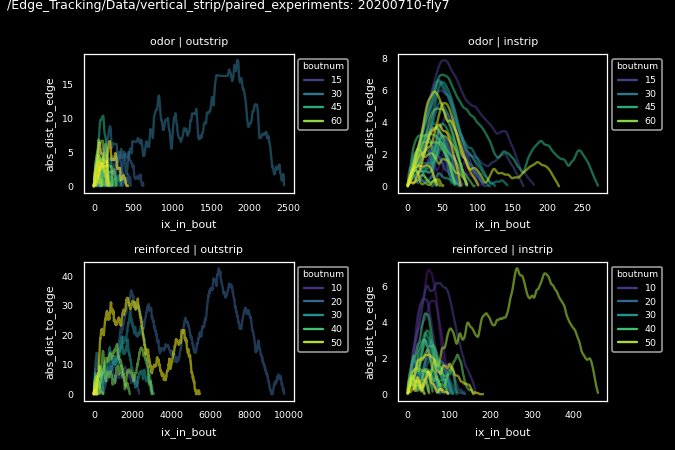

In [346]:
palette='viridis'
fig, axn = pl.subplots(2, 2, sharey=False)
for ci, (cond, df_cond) in enumerate(df_.groupby('condition')):
    for ri, (instrip, df_instrip) in enumerate(df_cond.groupby('instrip')):
        instrip_label = 'instrip' if instrip else 'outstrip'
        ax=axn[ci, ri]
        ax.set_title('{} | {}'.format(cond, instrip_label))
        sns.lineplot(x='ix_in_bout', y='abs_dist_to_edge', 
             data=df_instrip, ax=ax, hue='boutnum', palette=palette, alpha=0.6)
        if instrip_label=='instrip':
            ax.invert_yaxis()
        ax.legend(bbox_to_anchor=(1,1), loc='upper left', fontsize=6, title='boutnum')
pl.subplots_adjust(wspace=0.5, hspace=0.5)
#pl.subplots_adjust(left=0.1,wspace=0.2, right=0.8, bottom=0.2, top=0.8)
util.label_figure(fig, '{}: {}'.format(fig_id, fly_id))
pl.savefig(os.path.join(figdir, 'individuals', '{}_{}_bybout.png'.format(yvar, fly_id)))

#### summary over bouts

In [348]:
abs_dist = df_.groupby(['condition', 'instrip', 'boutnum'])\
                .apply(lambda x: x['abs_dist_to_edge'].max()-x['abs_dist_to_edge'].min())\
                .reset_index(name='sum_abs_dist_to_edge')
abs_dist.head()

,condition,instrip,boutnum,sum_abs_dist_to_edge
0,odor,False,2,4.112409
1,odor,False,4,5.936514
2,odor,False,6,2.943347
3,odor,False,8,3.319586
4,odor,False,10,5.552781


In [360]:
df_.groupby(['boutnum', 'condition', 'instrip'])['abs_dist_to_edge'].median().reset_index()

/home/julianarhee/anaconda3/envs/plume/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/julianarhee/anaconda3/envs/plume/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


,boutnum,condition,instrip,abs_dist_to_edge
0,1,odor,True,NaN
1,1,reinforced,True,NaN
2,2,odor,False,1.742518
3,2,reinforced,False,1.736909
4,3,odor,True,1.431042
...,...,...,...,...
125,69,odor,True,3.273447
126,70,odor,False,3.725453
127,71,odor,True,1.192695
128,72,odor,False,2.736506


<IPython.core.display.Javascript object>


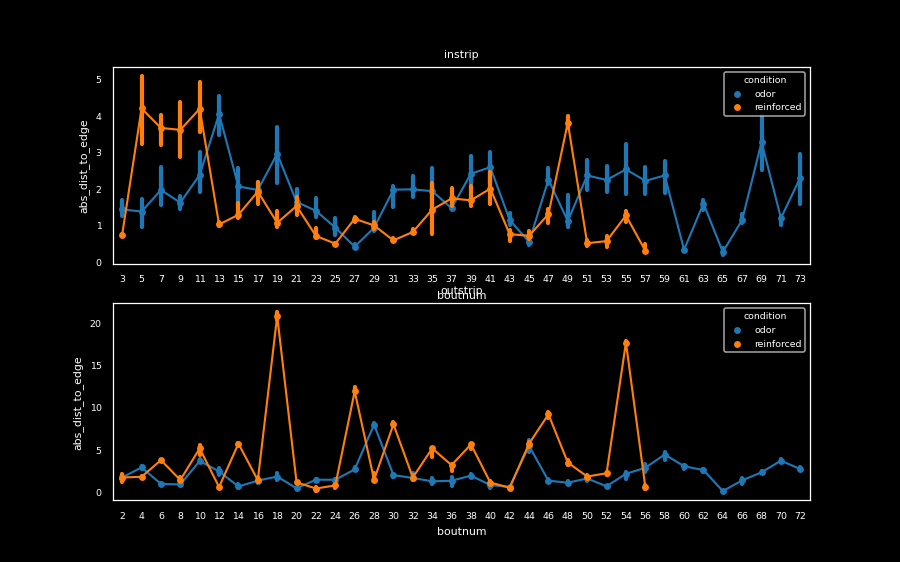

Text(0.5, 1.0, 'outstrip')

In [366]:
fig, axn = pl.subplots(2, 1, figsize=(8, 5))
ax=axn[0]
sns.pointplot(data=df_[(df_['instrip']) & (df_['boutnum']>1)], estimator='median', scale=0.5,
               x='boutnum', y='abs_dist_to_edge', hue='condition', ax=ax)
ax.set_title('instrip')
ax=axn[1]
sns.pointplot(data=df_[~(df_['instrip']) & (df_['boutnum']>1)], estimator='median', scale=0.5,
               x='boutnum', y='abs_dist_to_edge', hue='condition', ax=ax)
ax.set_title('outstrip')

pl.subplots_adjust(wspace=0.5, hspace=0.5)
#pl.subplots_adjust(left=0.1,wspace=0.2, right=0.8, bottom=0.2, top=0.8)
util.label_figure(fig, '{}: {}'.format(fig_id, fly_id))
pl.savefig(os.path.join(figdir, 'individuals', '{}_{}_bybout.png'.format(yvar, fly_id)))

<IPython.core.display.Javascript object>


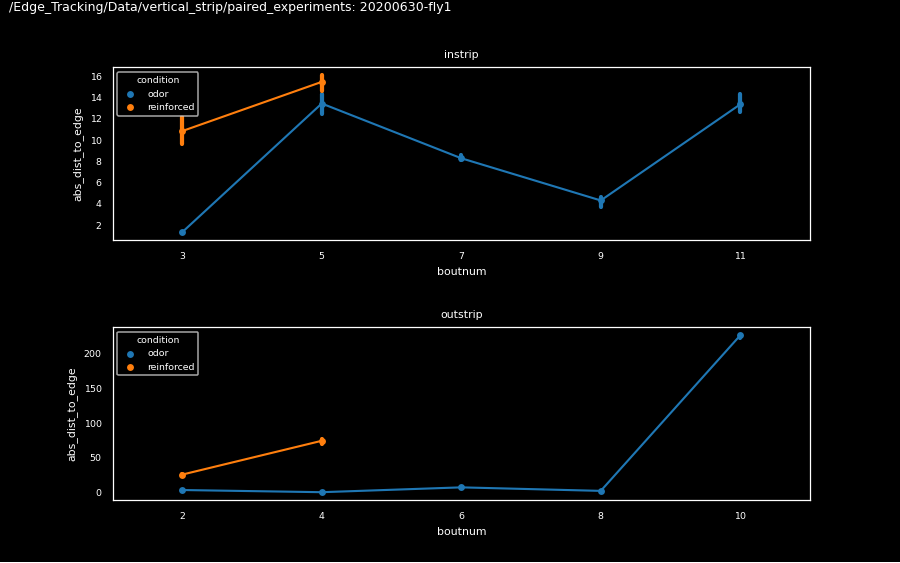

<IPython.core.display.Javascript object>


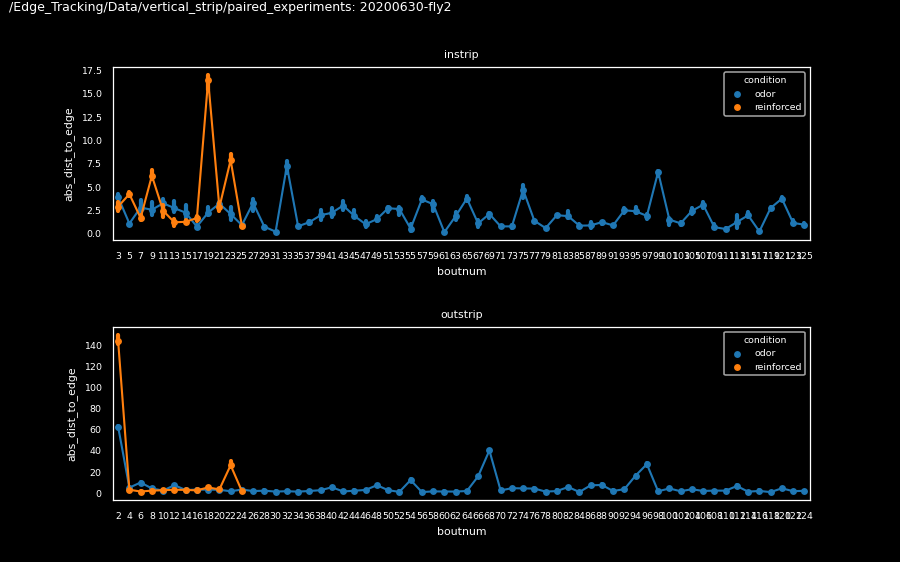

<IPython.core.display.Javascript object>


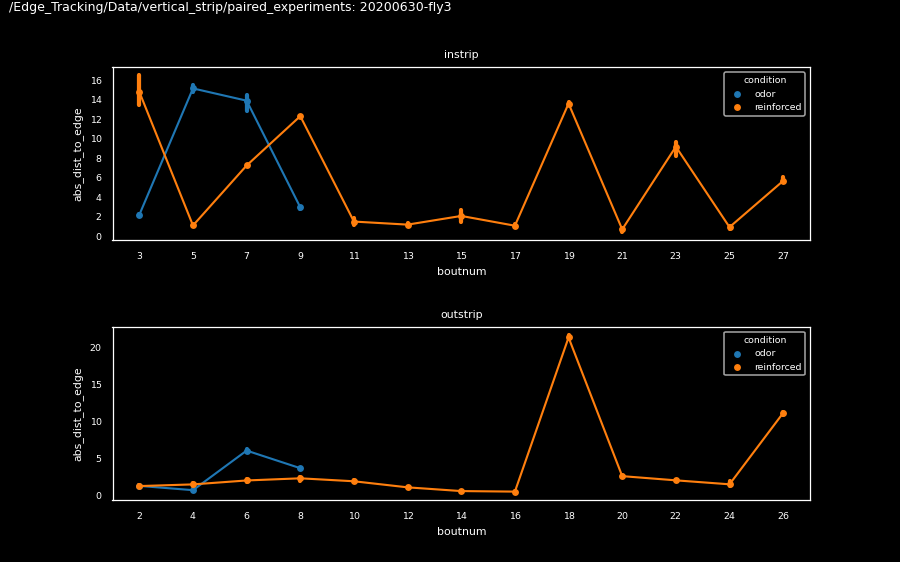

<IPython.core.display.Javascript object>


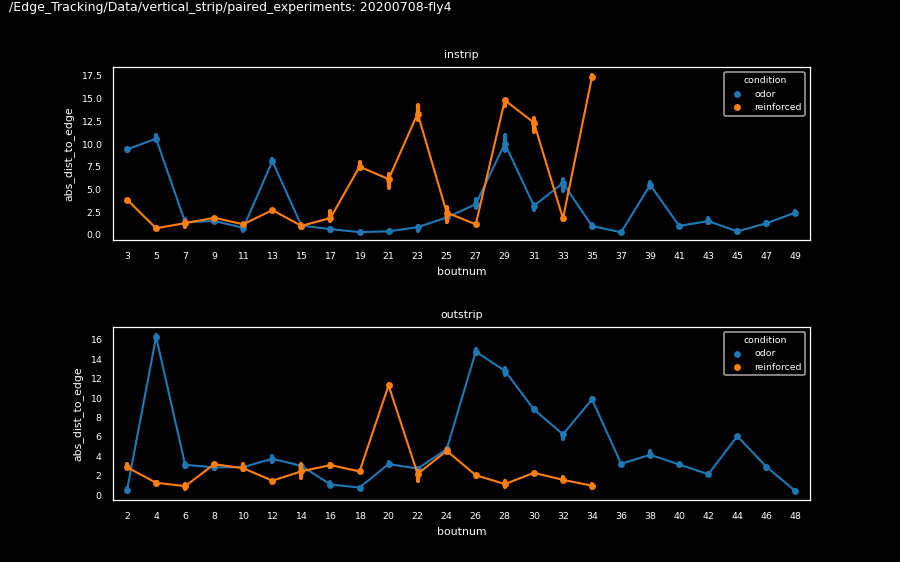

<IPython.core.display.Javascript object>


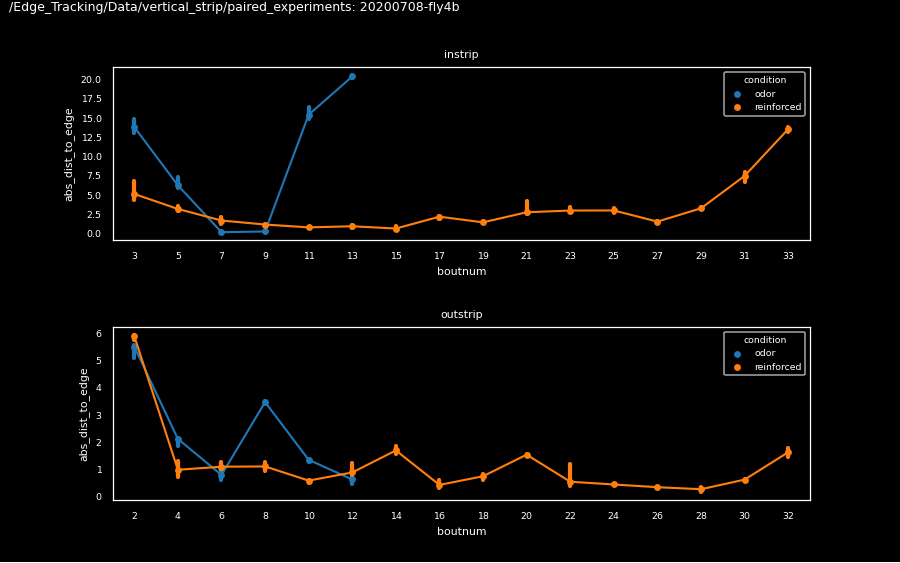

<IPython.core.display.Javascript object>


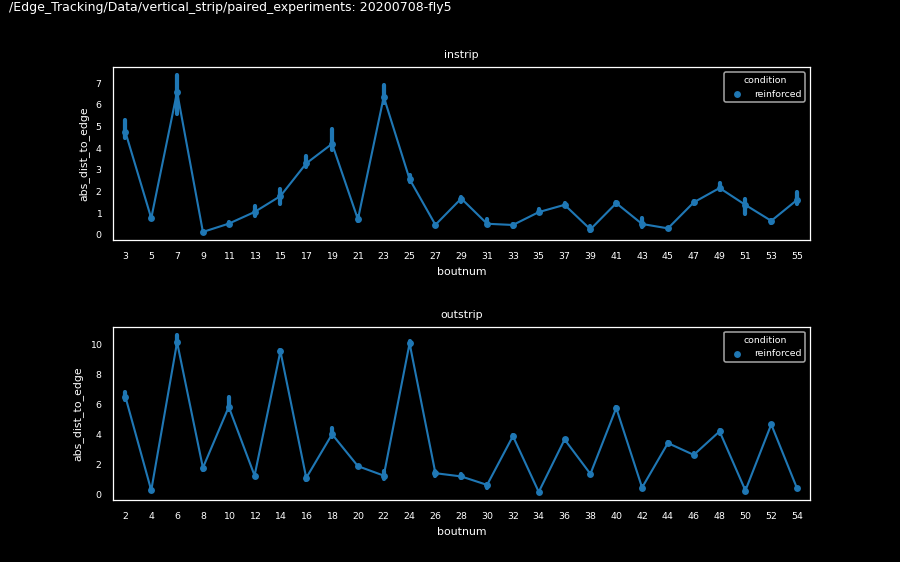

<IPython.core.display.Javascript object>


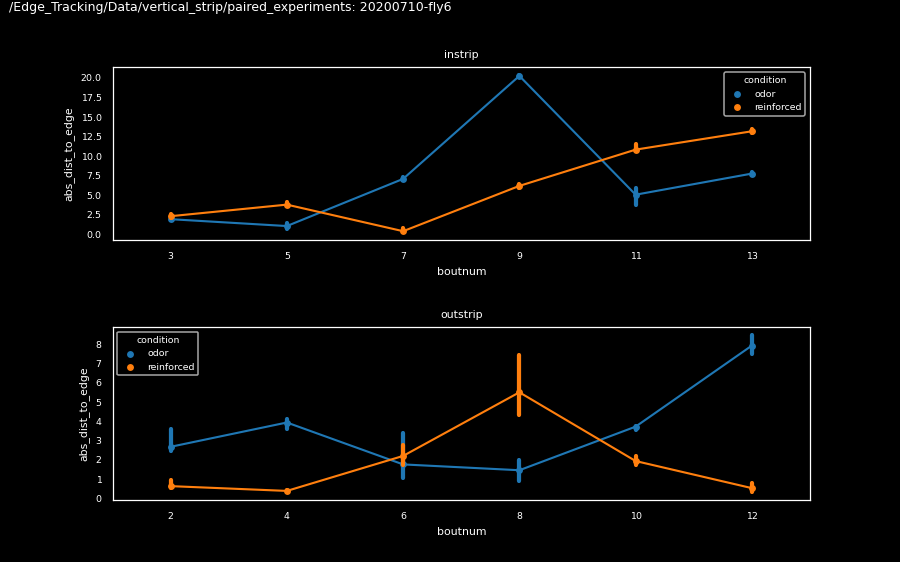

<IPython.core.display.Javascript object>


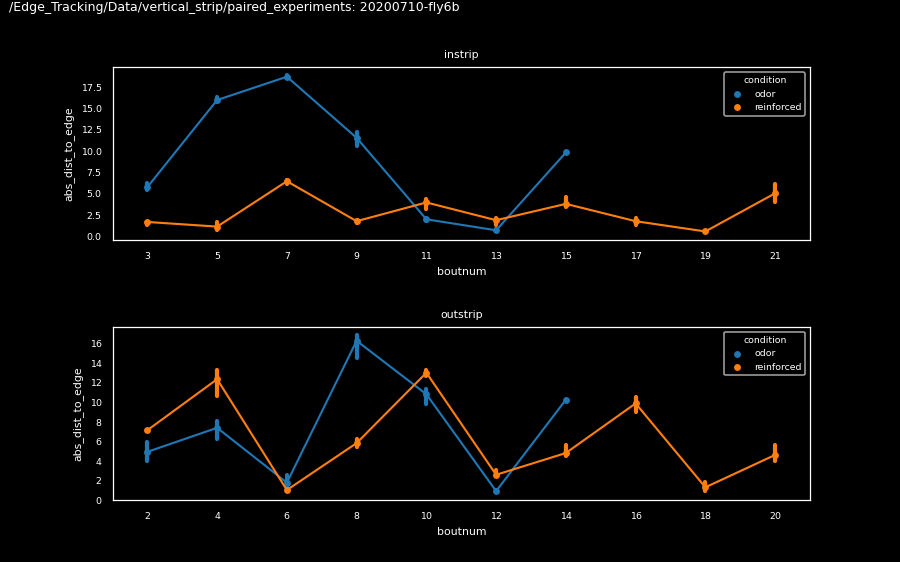

<IPython.core.display.Javascript object>


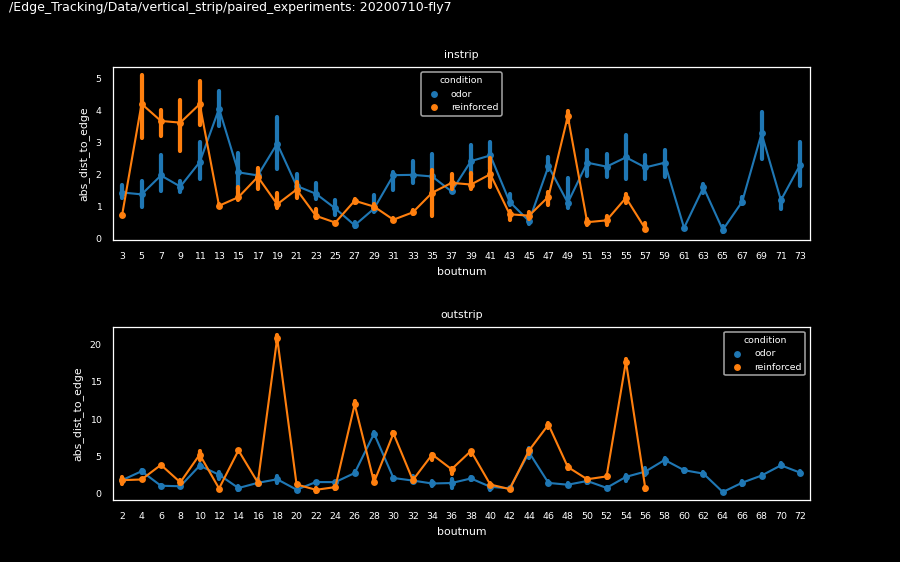

<IPython.core.display.Javascript object>


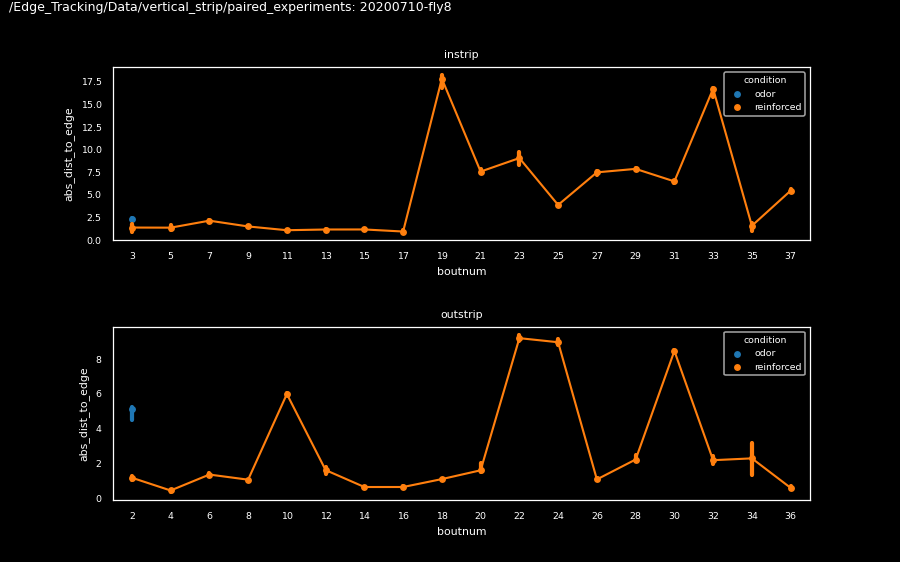

<IPython.core.display.Javascript object>


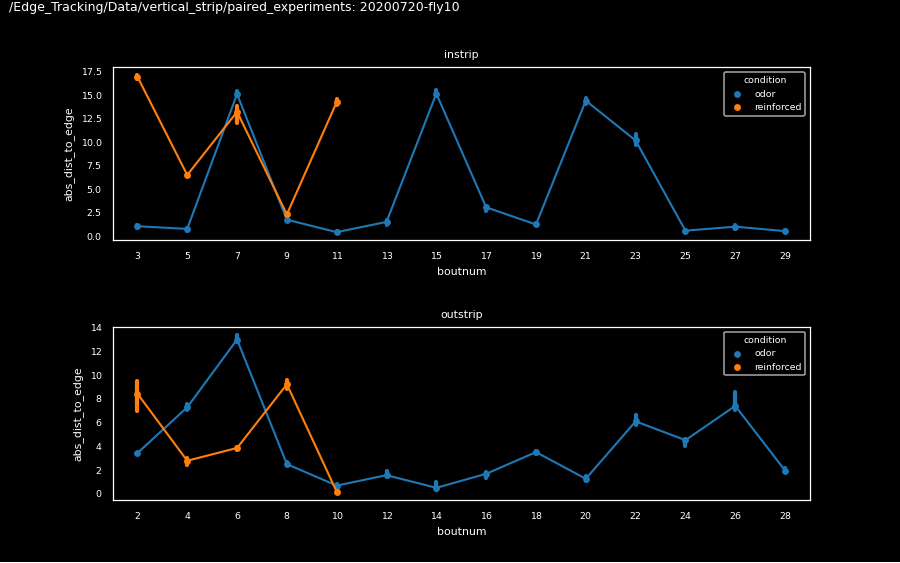

<IPython.core.display.Javascript object>


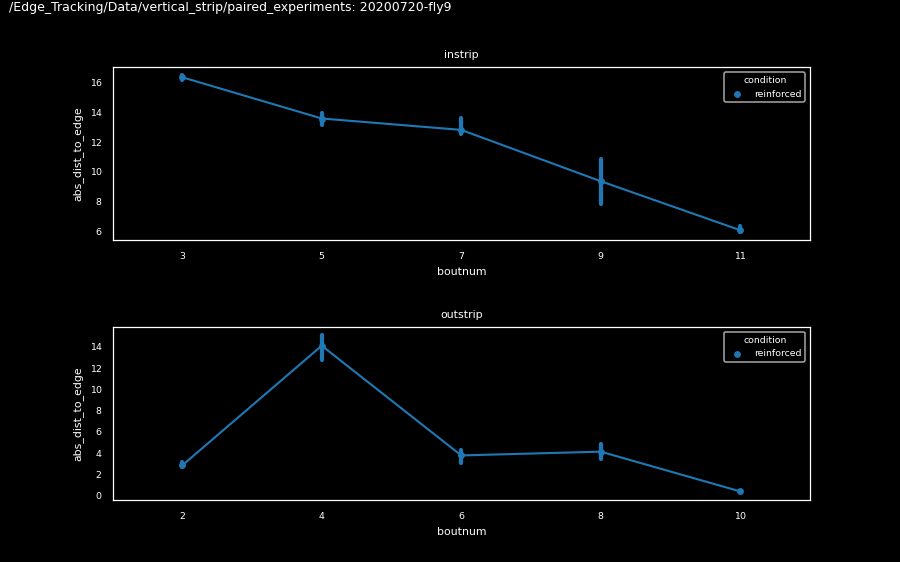

In [369]:
for fly_id, df_ in df_e.groupby('fly_id'):
    fig, axn = pl.subplots(2, 1, figsize=(8, 5))
    ax=axn[0]
    sns.pointplot(data=df_[(df_['instrip']) & (df_['boutnum']>1)], estimator='median', scale=0.5,
                   x='boutnum', y='abs_dist_to_edge', hue='condition', ax=ax)
    ax.set_title('instrip')
    ax=axn[1]
    sns.pointplot(data=df_[~(df_['instrip']) & (df_['boutnum']>1)], estimator='median', scale=0.5,
                   x='boutnum', y='abs_dist_to_edge', hue='condition', ax=ax)
    ax.set_title('outstrip')

    pl.subplots_adjust(wspace=0.5, hspace=0.5)
    #pl.subplots_adjust(left=0.1,wspace=0.2, right=0.8, bottom=0.2, top=0.8)
    util.label_figure(fig, '{}: {}'.format(fig_id, fly_id))
    pl.savefig(os.path.join(figdir, 'individuals', '{}-avg_{}_bybout.png'.format(yvar, fly_id)))

#### plot for each fly

<IPython.core.display.Javascript object>


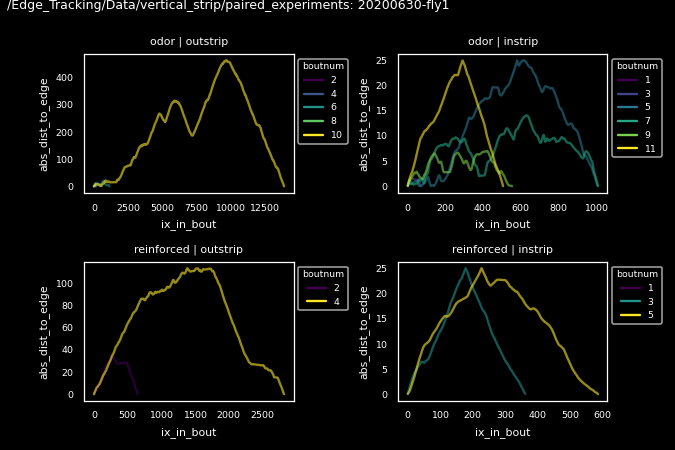

<IPython.core.display.Javascript object>


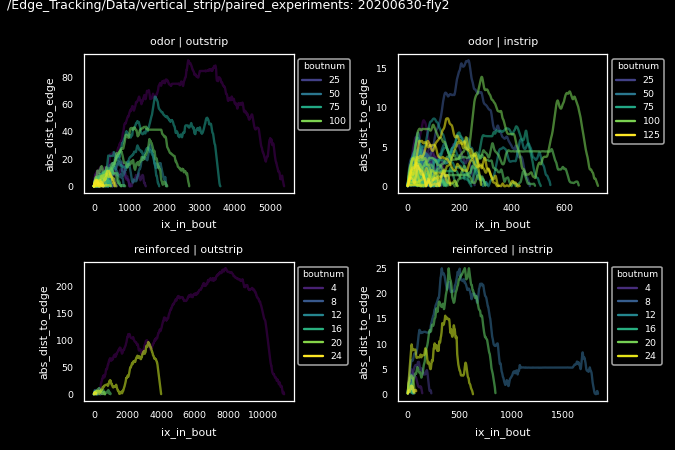

<IPython.core.display.Javascript object>


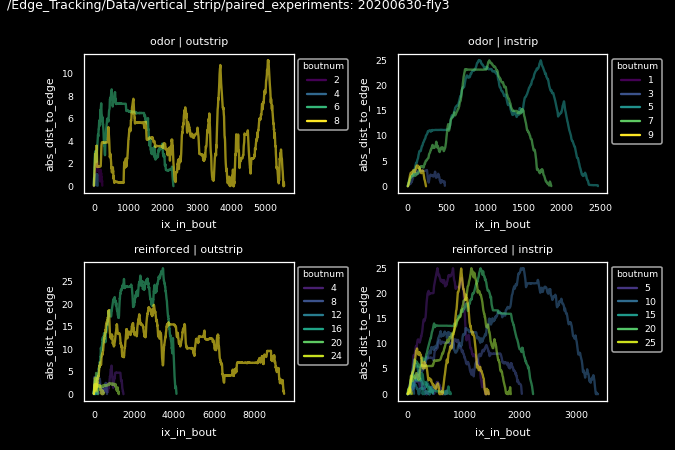

<IPython.core.display.Javascript object>


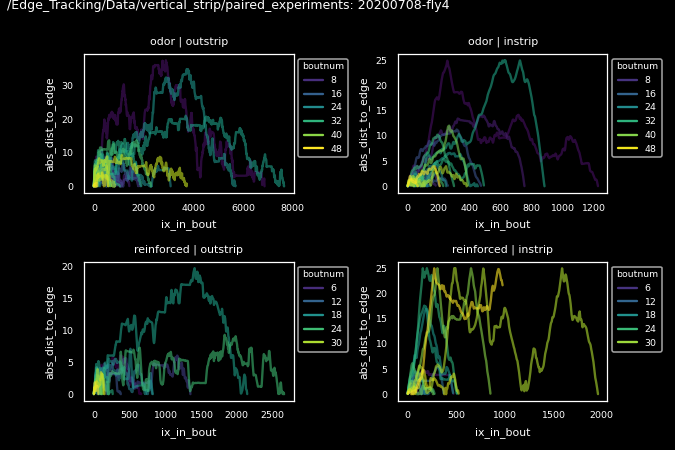

<IPython.core.display.Javascript object>


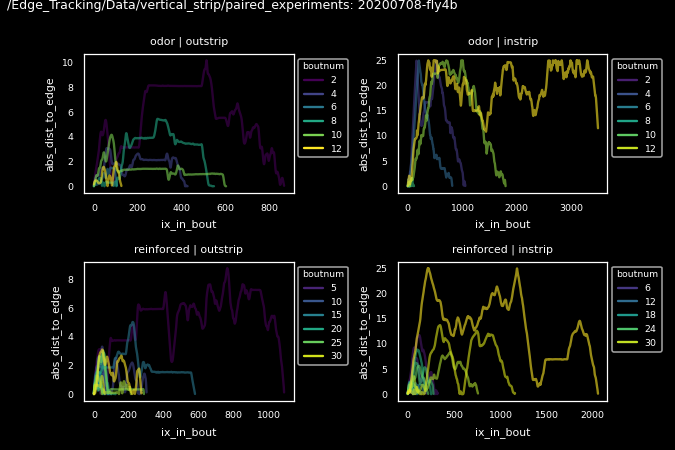

<IPython.core.display.Javascript object>


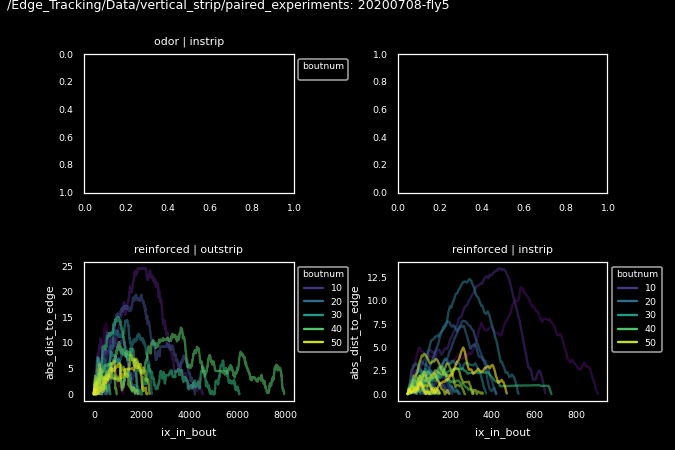

<IPython.core.display.Javascript object>


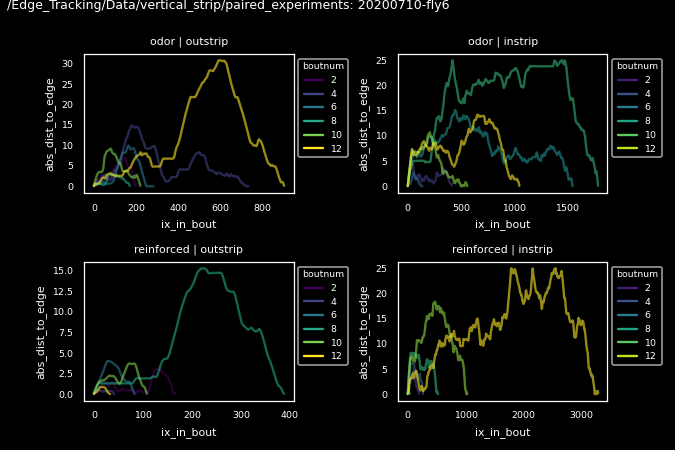

<IPython.core.display.Javascript object>


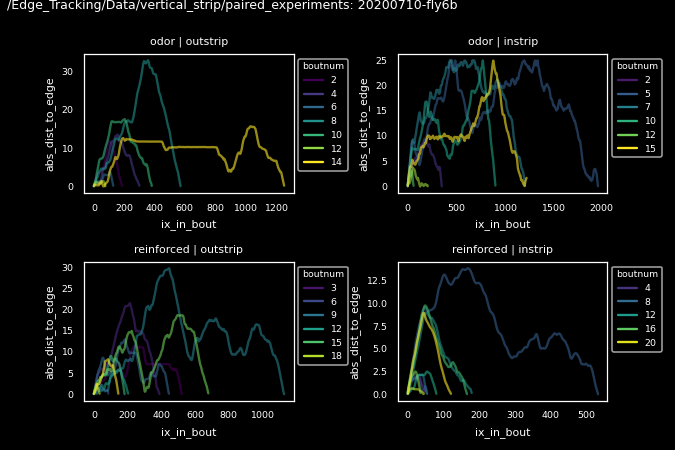

<IPython.core.display.Javascript object>


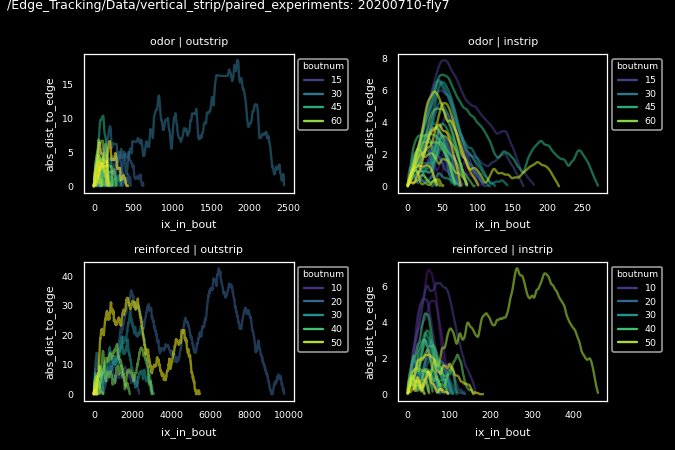

<IPython.core.display.Javascript object>


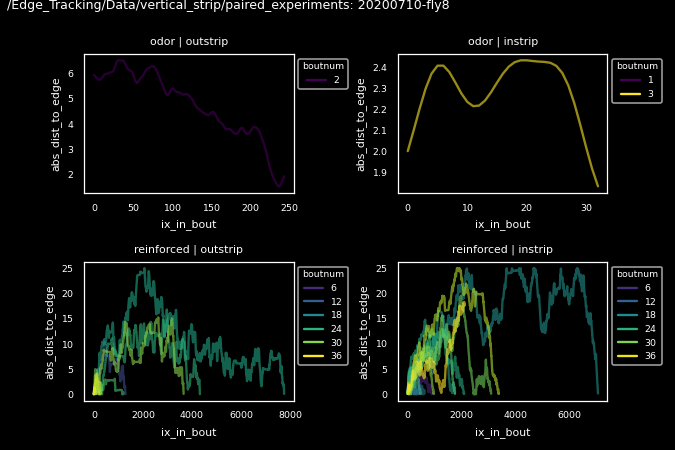

<IPython.core.display.Javascript object>


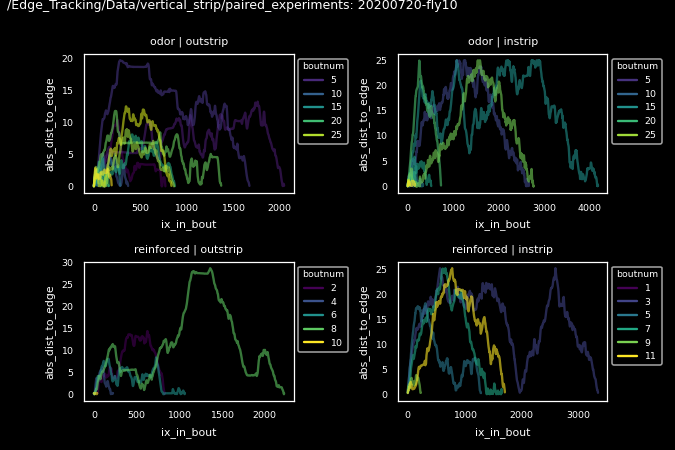

<IPython.core.display.Javascript object>


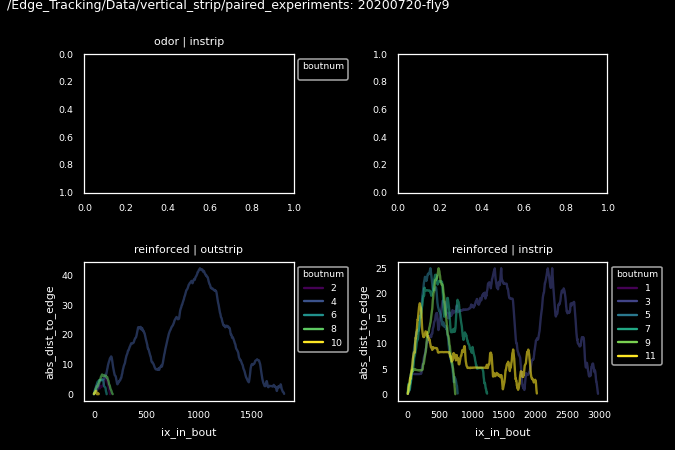

In [370]:
for fly_id, df_ in df_e.groupby('fly_id'):
    fig, axn = pl.subplots(2, 2, sharey=False)
    for ci, (cond, df_cond) in enumerate(df_.groupby('condition')):
        for ri, (instrip, df_instrip) in enumerate(df_cond.groupby('instrip')):
            instrip_label = 'instrip' if instrip else 'outstrip'
            ax=axn[ci, ri]
            ax.set_title('{} | {}'.format(cond, instrip_label))
            sns.lineplot(x='ix_in_bout', y='abs_dist_to_edge', 
                 data=df_instrip, ax=ax, hue='boutnum', palette=palette, alpha=0.6)
            if instrip_label=='instrip':
                ax.invert_yaxis()
            ax.legend(bbox_to_anchor=(1,1), loc='upper left', fontsize=6, title='boutnum')
    pl.subplots_adjust(wspace=0.5, hspace=0.5)
    #pl.subplots_adjust(left=0.1,wspace=0.2, right=0.8, bottom=0.2, top=0.8)
    util.label_figure(fig, '{}: {}'.format(fig_id, fly_id))
    pl.savefig(os.path.join(figdir, 'individuals', '{}_{}_bybout.png'.format(yvar, fly_id)))

## N bouts in vs. out

<IPython.core.display.Javascript object>


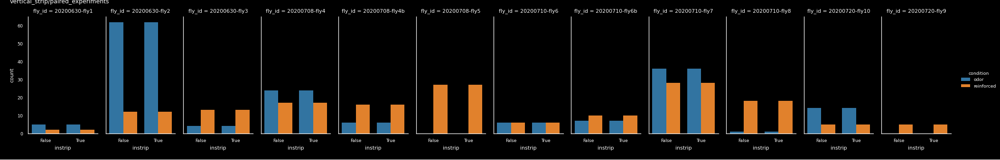

<IPython.core.display.Javascript object>


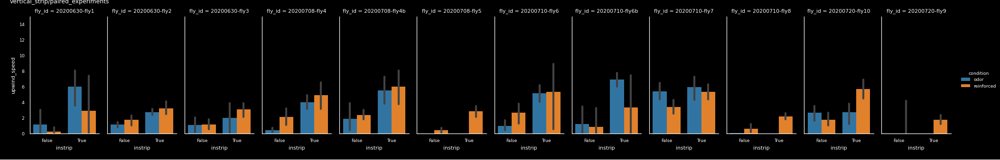

In [313]:
boutdf.groupby(['fly_id', 'condition', 'instrip'])['boutnum'].count()
g=sns.catplot(data=boutdf, col='fly_id', x='instrip', hue='condition', 
              height=3, aspect=.5, kind='count', edgecolor='none') 
util.label_figure(g.fig, experiment)
pl.savefig(os.path.join(figdir, 'all_Nbouts_by_cond.png'))

g=sns.catplot(data=boutdf, col='fly_id', x='instrip', y='upwind_speed', hue='condition', 
              height=3, aspect=.5, kind='bar', edgecolor='none') 
pl.ylim([0, 15])
util.label_figure(g.fig, experiment)
pl.savefig(os.path.join(figdir, 'all_upwind_speed_by_cond.png'))

# instaneous speed on each excursion?

In [882]:
fly_id='fly4'
#df = DF[(DF['fly_id']==fly_id) & (DF['condition']=='odor')].copy()
df_ = df_e[(df_e['fly_id']==fly_id) & (df_e['condition'].isin(['odor', 'reinforced']))].copy()
df_.columns
# df_['abs_dist_to_edge'] = abs( abs(df[xvar]) - odor_xmax)
# for (b, c), b_ in df.groupby(['boutnum', 'condition']):
#     df.loc[b_.index, 'ix_in_bout'] = np.arange(0, b_.shape[0])
#     df.loc[b_.index, 'ft_posy_norm'] = b_['smoothed_ft_posy'] - b_['smoothed_ft_posy'].iloc[0] 
# bdf = boutdf[boutdf['fly_id']==fly_id].copy()

Index(['timestamp -- motor_step_command', 'mfc1_stpt', 'mfc2_stpt',
       'mfc3_stpt', 'led1_stpt', 'led2_stpt', 'ft_posx', 'ft_posy',
       'ft_heading', 'ft_frame', 'ft_error', 'ft_roll', 'ft_pitch', 'ft_yaw',
       'instrip', 'led_on', 'timestamp', 'motor_step_command', 'time',
       'experiment', 'fly_id', 'condition', 'smoothed_ft_posx',
       'smoothed_ft_posy', 'boutnum', 'rel_time', 'cum_time', 'speed',
       'upwind_speed', 'crosswind_speed', 'euclid_dist', 'upwind_dist',
       'crosswind_dist', 'ix_in_bout', 'ft_posy_norm', 'abs_dist_to_edge',
       'time_bin'],
      dtype='object')

<IPython.core.display.Javascript object>


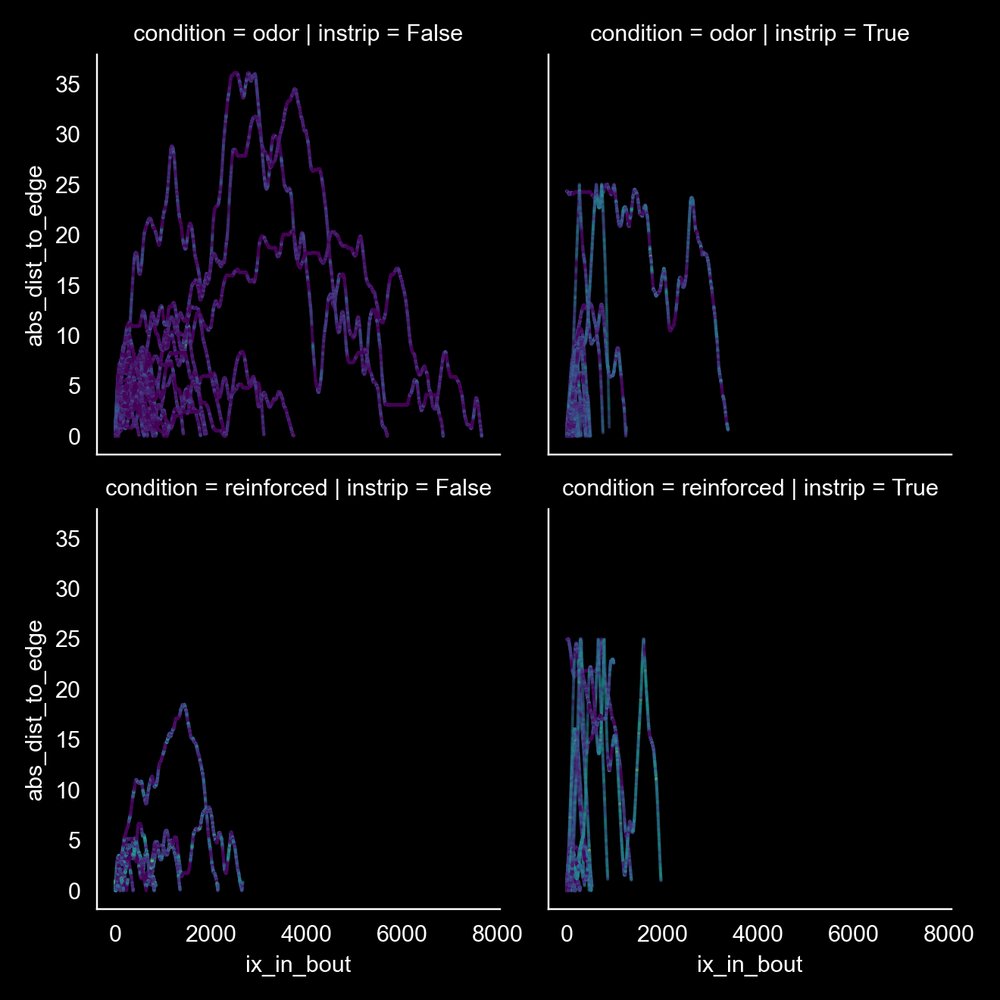

In [887]:
g = sns.FacetGrid(data=df_, col='instrip', row='condition', sharex=True)
g.map_dataframe(sns.scatterplot, x='ix_in_bout', y='abs_dist_to_edge', hue='speed',
                s=2, legend=False, alpha=0.5, edgecolor='none', palette='viridis')

In [884]:
fly_id='fly4'
#df = DF[(DF['fly_id']==fly_id) & (DF['condition']=='odor')].copy()
df_ = df_e[(df_e['fly_id']==fly_id) & (df_e['condition'].isin(['odor', 'reinforced']))].copy()

# df['abs_dist_to_edge'] = abs( abs(df['ft_posx']) - odor_xmax)
# for (b, c), b_ in df.groupby(['boutnum', 'condition']):
#     df.loc[b_.index, 'ix_in_bout'] = np.arange(0, b_.shape[0])
#     df.loc[b_.index, 'ft_posy_norm'] = b_['ft_posy'] - b_['ft_posy'].iloc[0]
    

<IPython.core.display.Javascript object>


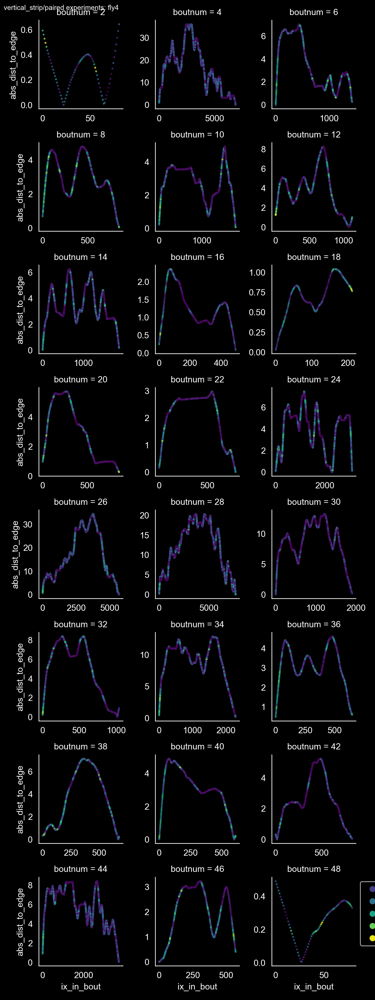

/Users/julianarhee/Documents/rutalab/data/figures/vertical_strip/pairedexperiments/fly4_dist-across-bout_hue-speed_outbouts-odor.png


<IPython.core.display.Javascript object>


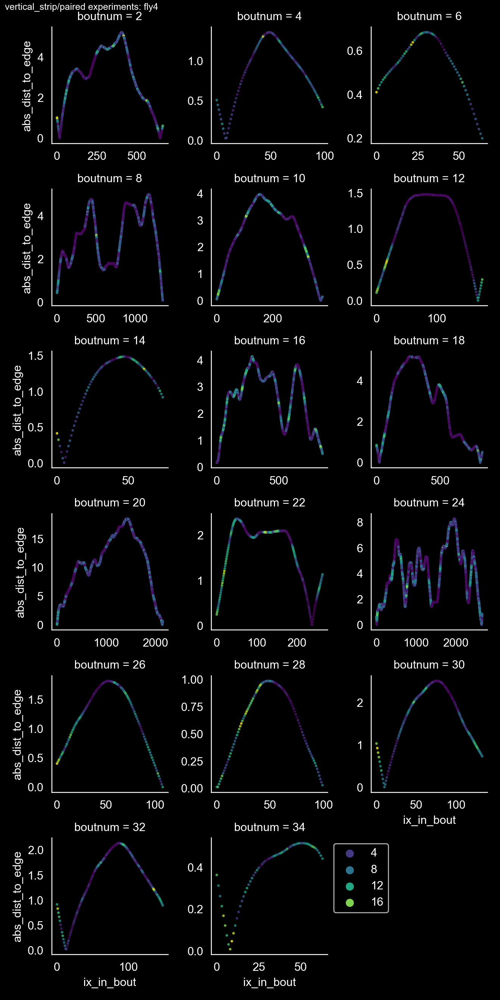

/Users/julianarhee/Documents/rutalab/data/figures/vertical_strip/pairedexperiments/fly4_dist-across-bout_hue-speed_outbouts-reinforced.png


In [885]:
xvar='ix_in_bout'
yvar = 'abs_dist_to_edge'
huevar='speed'

for cond in conditions:
    plotdf = df_[df_['condition']==cond].copy()
    g = sns.FacetGrid(data=plotdf[~plotdf['instrip']], col='boutnum', col_wrap=3, height=2,
                     sharex=False, sharey=False)
    g.map_dataframe(sns.scatterplot, x=xvar, y=yvar, hue=huevar,
                     s=5, legend=True, alpha=0.8, edgecolor='none', palette='viridis')
    pl.legend(bbox_to_anchor=(1,1), loc='upper left')

    util.label_figure(g.fig, '{}: {}'.format(experiment, fly_id))
    figname = '{}_dist-across-bout_hue-speed_outbouts-{}.png'.format(fly_id, cond)
    pl.savefig(os.path.join(save_dir, figname))
    print(os.path.join(save_dir, figname))

<IPython.core.display.Javascript object>


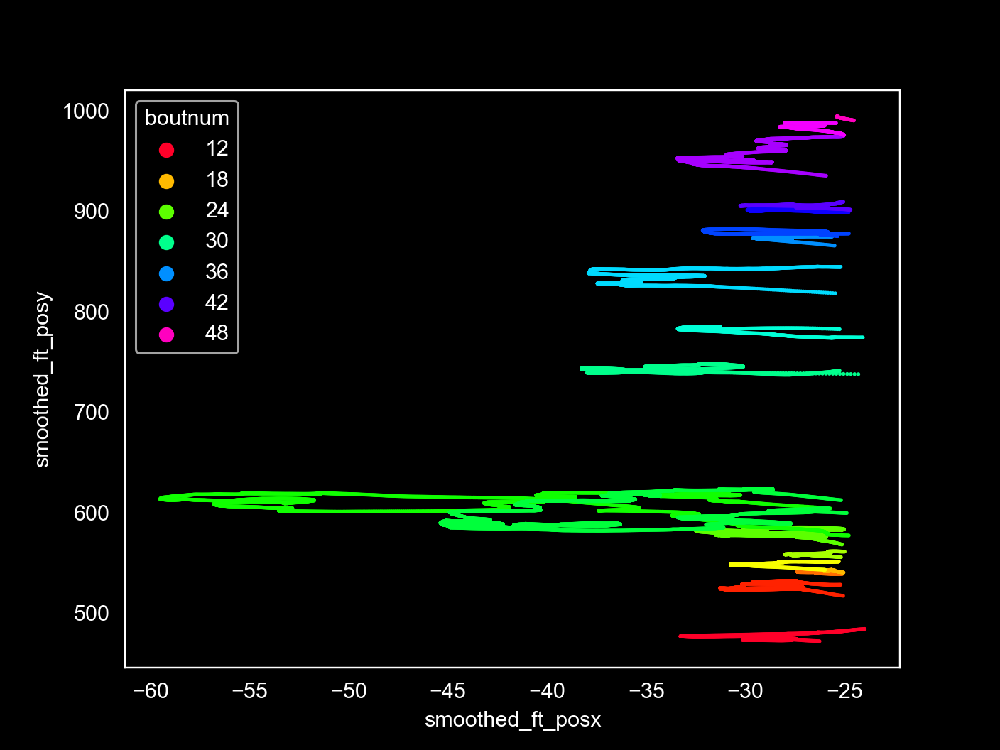

<AxesSubplot: xlabel='smoothed_ft_posx', ylabel='smoothed_ft_posy'>

In [888]:
plotdf = df_[(df_['condition']=='odor') & (~df_['instrip']) & (df_['boutnum']>10)]
fig, ax = pl.subplots()
sns.scatterplot(data=plotdf, x='smoothed_ft_posx', y='smoothed_ft_posy', ax=ax, 
                hue='boutnum', edgecolor='none', palette='gist_rainbow', s=3)

In [889]:
plotdf['boutnum'].unique()

array([12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44,
       46, 48])

<IPython.core.display.Javascript object>


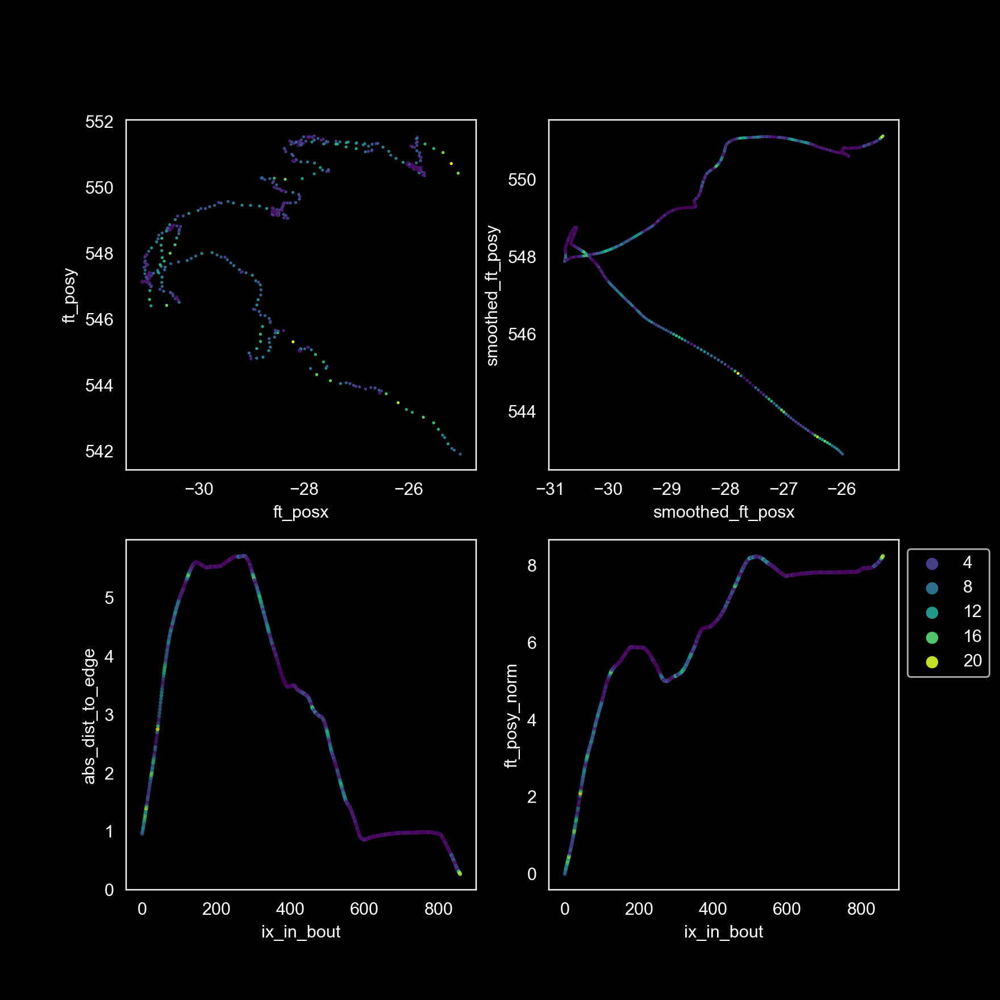

In [890]:
xvar='smoothed_ft_posx'
yvar = 'smoothed_ft_posy'
boutnum=20
# ----------------------------------------------
df_ = plotdf[plotdf['boutnum']==boutnum].copy()
df_ = butil.calculate_turn_angle(df_)
df_['turn_angle_deg'] = np.rad2deg(df_['turn_angle'])
df_['stopped'] = False
df_.loc[df_['speed'] <=1, 'stopped'] = True
# ----------------------------------------------
# xvar='ix_in_bout'
# yvar = 'abs_dist_to_edge'
# huevar='speed'
fig, axes = pl.subplots(2,2, figsize=(8,8))
ax=axes[0, 0]
sns.scatterplot(data=df_, x='ft_posx', y='ft_posy', ax=ax, 
                hue='speed', edgecolor='none', palette='viridis', s=3, legend=False)
ax=axes[0,1]
sns.scatterplot(data=df_, x='smoothed_ft_posx', y='smoothed_ft_posy', ax=ax, 
                hue='speed', edgecolor='none', palette='viridis', s=3, legend=False)
ax=axes[1, 0]
sns.scatterplot(data=df_, x='ix_in_bout', y='abs_dist_to_edge', 
                hue='speed', ax=ax, s=5, legend=False, alpha=0.8, edgecolor='none', 
                palette='viridis')
ax=axes[1,1]
sns.scatterplot(data=df_, x='ix_in_bout', y='ft_posy_norm', 
                hue='speed', ax=ax, s=5, legend=True, alpha=0.8, edgecolor='none', 
                palette='viridis')
ax.legend(bbox_to_anchor=(1,1), loc='upper left')
for ax in axes.flat:
    ax.set_box_aspect(1)

In [552]:
import sys
!conda install --yes --prefix {sys.prefix} rdp

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.13.0
  latest version: 22.9.0

Please update conda by running

    $ conda update -n base conda



## Package Plan ##

  environment location: /Users/julianarhee/miniforge3/envs/plume

  added / updated specs:
    - rdp


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2022.9.24  |       h4653dfc_0         150 KB  conda-forge
    certifi-2022.9.24          |     pyhd8ed1ab_0         155 KB  conda-forge
    rdp-0.8                    |     pyhd8ed1ab_0           8 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         313 KB

The following NEW packages will be INSTALLED:

  rdp                conda-forge/noarch::rdp-0.8-pyhd8ed1ab_0

The following packages will be UPDATED:

  ca-certificates  

In [554]:
import rdp

In [680]:
def dsquared_line_points(P1, P2, points):
    '''
    Calculate only squared distance, only needed for comparison
    http://en.wikipedia.org/wiki/Distance_from_a_point_to_a_line
    '''
    xdiff = P2[0] - P1[0]
    ydiff = P2[1] - P1[1]
    nom  = (
        ydiff*points[:,0] - \
        xdiff*points[:,1] + \
        P2[0]*P1[1] - \
        P2[1]*P1[0]
    )**2
    denom = ydiff**2 + xdiff**2
    return np.divide(nom, denom)

def rdp_numpy(M, epsilon = 0):

    # initiate mask array
    # same amount of points
    mask = np.empty(M.shape, dtype = bool)

    # Assume all points are valid and falsify those which are found
    mask.fill(True)

    # The stack to select start and end index
    stack = [(0 , M.shape[0]-1)]

    while (len(stack) > 0):
        # Pop the last item
        (start, end) = stack.pop()

        # nothing to calculate if no points in between
        if end - start <= 1:
            continue

        # Calculate distance to points
        P1 = M[start]
        P2 = M[end]
        points = M[start + 1:end]
        dsq = dsquared_line_points(P1, P2, points)

        mask_eps = dsq > epsilon**2

        if mask_eps.any():
            # max point outside eps
            # Include index that was sliced out
            # Also include the start index to get absolute index
            # And not relative 
            mid = np.argmax(dsq) + 1 + start
            stack.append((start, mid))
            stack.append((mid, end))

        else:
            # Points in between are redundant
            mask[start + 1:end] = False

    return mask

def rdp_mask(df, epsilon=0.1):
    M = df[['ft_posx', 'ft_posy']].values
    simp = rdp_numpy(M, epsilon = epsilon)

    return simp

def add_rdp_by_bout(df_, epsilon=0.1):
    df_['rdp_posx'] = None
    df_['rdp_posy'] = None
    for b, b_ in df_.groupby(['condition', 'boutnum']):
        simp = rdp_mask(b_, epsilon=epsilon)
        df_.loc[b_.index, 'rdp_posx'] = simp[:, 0]
        df_.loc[b_.index, 'rdp_posy'] = simp[:, 1]
    return df_

In [ ]:
import 

In [892]:
fly_id='fly4'
#df = DF[(DF['fly_id']==fly_id) & (DF['condition']=='odor')].copy()
df_ = df_e[(df_e['fly_id']==fly_id) & (df_e['condition'].isin(['odor', 'reinforced']))].copy()
#df_ = DF[(DF['fly_id']==fly_id)].copy()


In [893]:
smooth_window=11
for varname in ['ft_posx', 'ft_posy']:
    df_ = butil.smooth_traces(df_, varname=varname, window_size=smooth_window)
df_ = add_rdp_by_bout(df_, epsilon=rdp_epsilon)

<IPython.core.display.Javascript object>


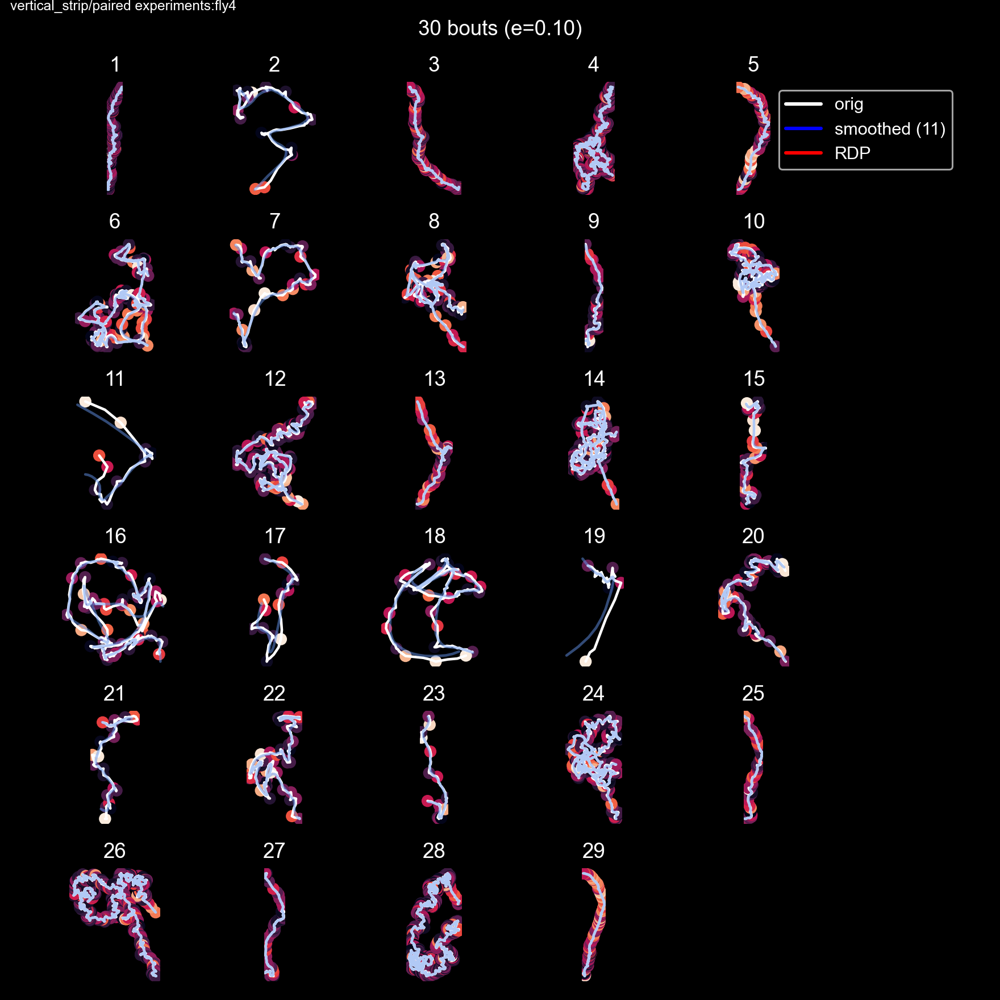

rdp_epsilon0p1_fly4


In [904]:
rdp_epsilon=0.1
nr=6
nc=5
nbouts_plot=nc*nr
fig, axes = pl.subplots(nr, nc, figsize=(8,8))
for ax, bnum in zip(axes.flat, np.arange(1, nr*nc)):
    b_ = df_[(df_['condition']=='odor') & (df_['boutnum']==bnum)].copy()
    #simp = rdp.rdp(b_[['ft_posx', 'ft_posy']].values, epsilon=0.1)
#     M = b_[['ft_posx', 'ft_posy']].values
#     simp = rdp_numpy(M, epsilon = 0.1)
#     df_.loc[b_.index, 'rdp_posx'] = simp[:, 0]
#     df_.loc[b_.index, 'rdp_posy'] = simp[:, 1]
    #b_ = rdp_mask(b_, epsilon=rdp_epsilon)
    # plot
    ax.plot(b_['ft_posx'], b_['ft_posy'], 'w', alpha=1)
    ax.plot(b_['smoothed_ft_posx'], b_['smoothed_ft_posy'], 'cornflowerblue', alpha=0.5)
    #ax.plot(b_[b_['rdp_posx']]['ft_posx'], b_[b_['rdp_posy']]['ft_posy'], 'r', alpha=0.5)
    ax.scatter(b_[b_['rdp_posx']]['ft_posx'], b_[b_['rdp_posy']]['ft_posy'], 
               c=b_[b_['rdp_posy']]['speed'], alpha=1)
    ax.set_title(bnum)
for ax in axes.flat:
    ax.set_aspect('equal')
    ax.axis('off')
legh = [mpl.lines.Line2D([0], [0], color='w', lw=2, label='orig'),
        mpl.lines.Line2D([0], [0], color='b', lw=2, label='smoothed ({})'.format(smooth_window)),
       mpl.lines.Line2D([0], [0], color='r', lw=2, label='RDP')]
axes.flat[nc-1].legend(handles=legh, bbox_to_anchor=(1,1), loc='upper left')
fig.suptitle('{} bouts (e={:.2f})'.format(nbouts_plot, rdp_epsilon))
util.label_figure(fig, '{}:{}'.format(experiment, fly_id))
pl.tight_layout()

figname = 'rdp_epsilon{}_{}'.format(str(rdp_epsilon).replace('.', 'p'), fly_id)
print(figname)
#pl.savefig(os.path.join(save_dir, '{}.png'.format(figname)))

In [895]:
def compare_and_plot_rdp_hue(b_, hue_var='speed', cmap='viridis'):
    hue_min, hue_max = b_[hue_var].min(), b_[hue_var].max()

    fig, axes = pl.subplots(1, 3, sharex=True, sharey=True, figsize=(8,3))
    axes[0].set_title('original v. RDP')
    axes[0].plot(b_['ft_posx'], b_['ft_posy'], 'w', alpha=1)
    axes[0].plot(b_[b_['rdp_posx']]['ft_posx'], b_[b_['rdp_posy']]['ft_posy'], 'r', alpha=1)

    axes[1].plot(b_['ft_posx'], b_['ft_posy'], 'gray', lw=1)
    axes[1].scatter(b_['ft_posx'], b_['ft_posy'], c=b_[hue_var], cmap=speed_cmap)

    axes[2].plot(b_[b_['rdp_posx']]['ft_posx'], b_[b_['rdp_posy']]['ft_posy'], 'gray', lw=1)
    axes[2].scatter(b_[b_['rdp_posx']]['ft_posx'], b_[b_['rdp_posy']]['ft_posy'], 
               c=b_[b_['rdp_posx']][hue_var], cmap=cmap)
    # colorbar
    cmap = pl.get_cmap(cmap)
    norm = pl.Normalize(hue_min, hue_max)
    sm =  mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=axes[-1])
    cbar.ax.set_title(hue_var)
    
    return fig


In [896]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

In [897]:
bnum = 19
#b_ = butil.calculate_speed(b_)
#b_ = DF[(DF['fly_id']==fly_id) & (DF['condition']=='odor') & (DF['boutnum']==bnum)].copy()


<IPython.core.display.Javascript object>


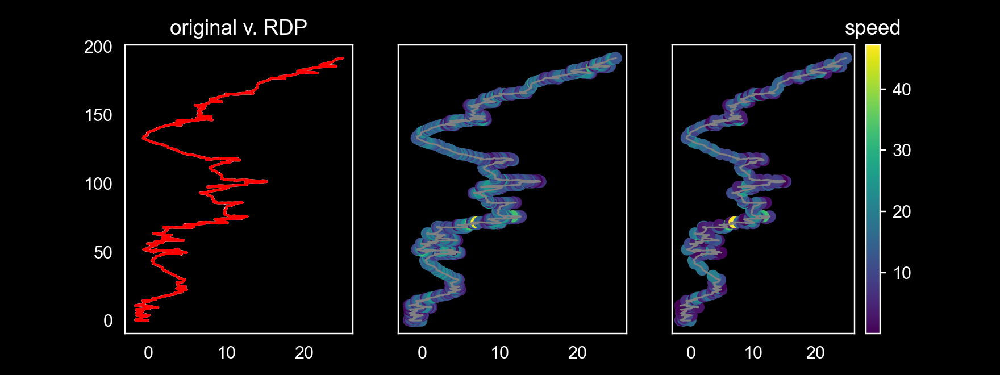

<IPython.core.display.Javascript object>


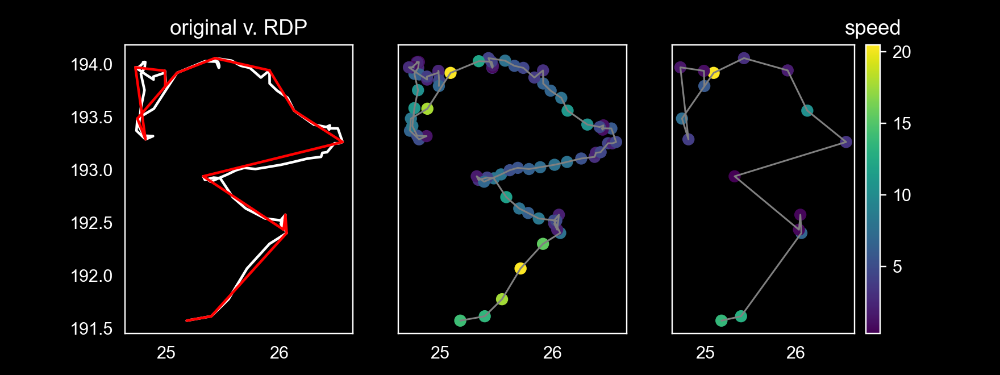

<IPython.core.display.Javascript object>


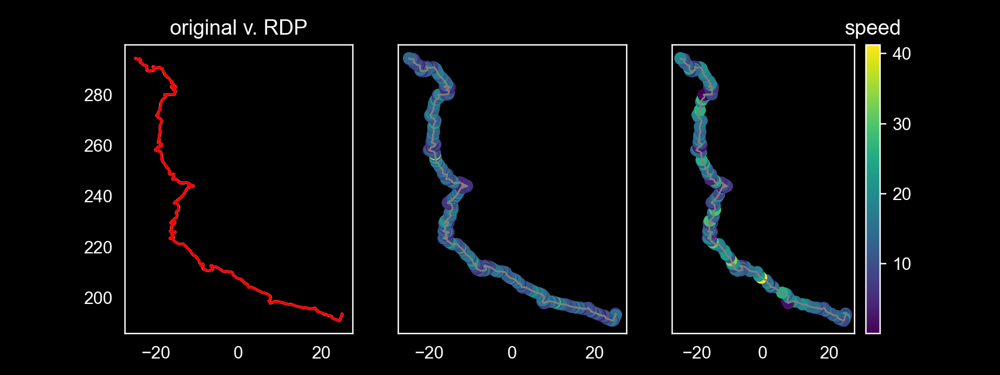

<IPython.core.display.Javascript object>


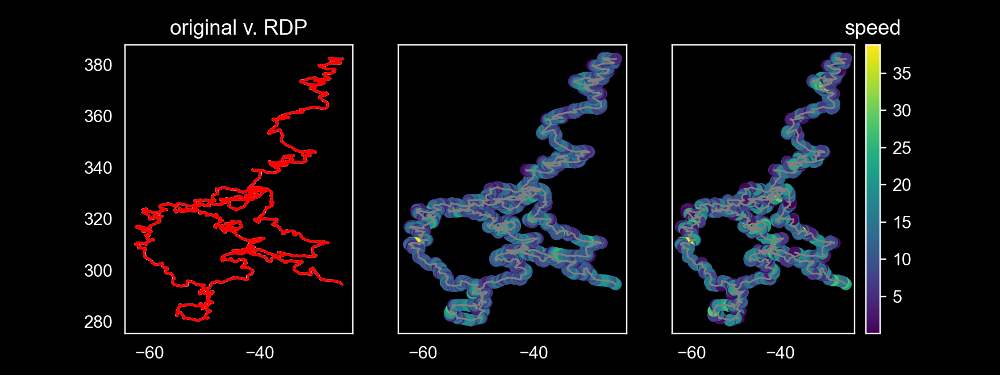

<IPython.core.display.Javascript object>


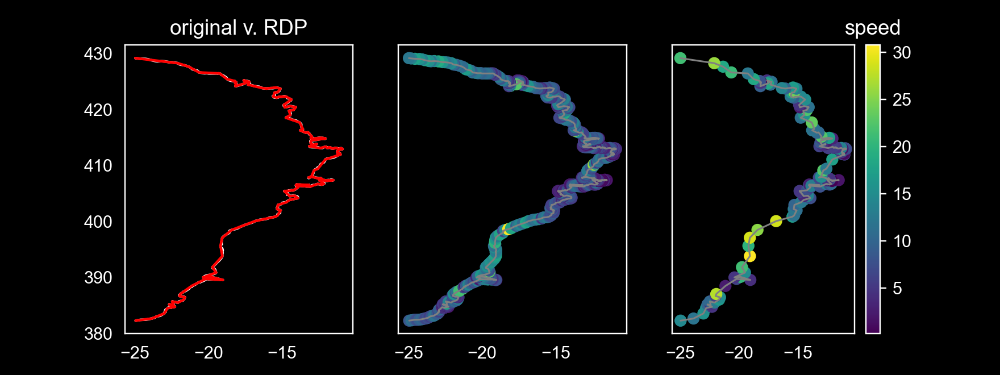

<IPython.core.display.Javascript object>


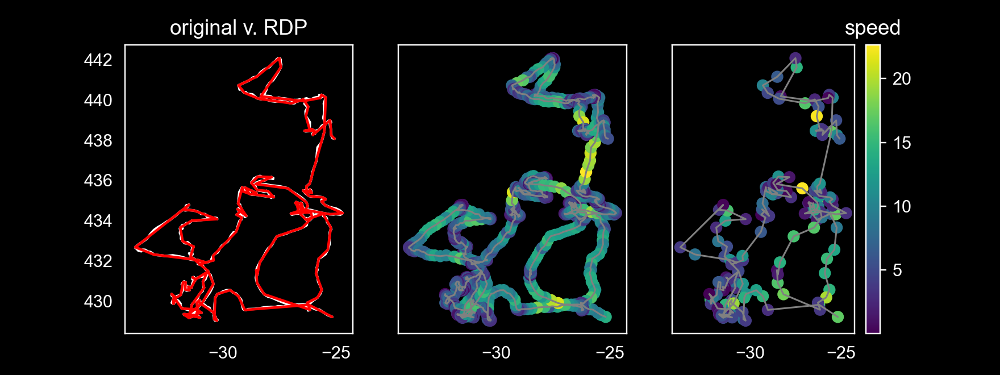

<IPython.core.display.Javascript object>


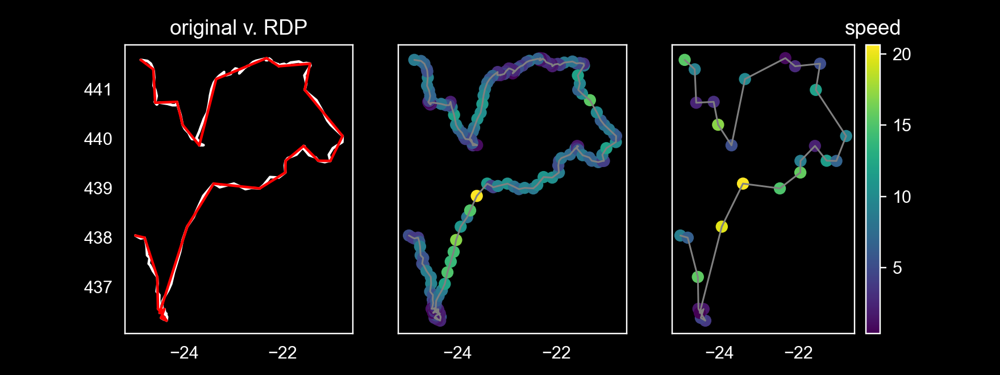

<IPython.core.display.Javascript object>


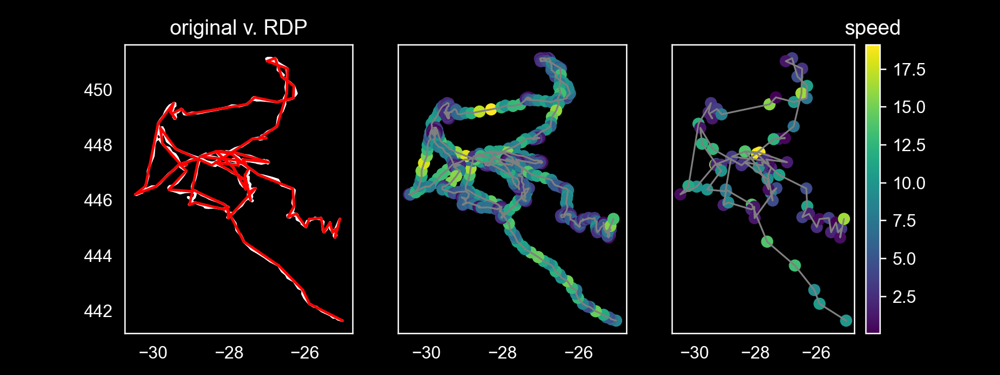

<IPython.core.display.Javascript object>


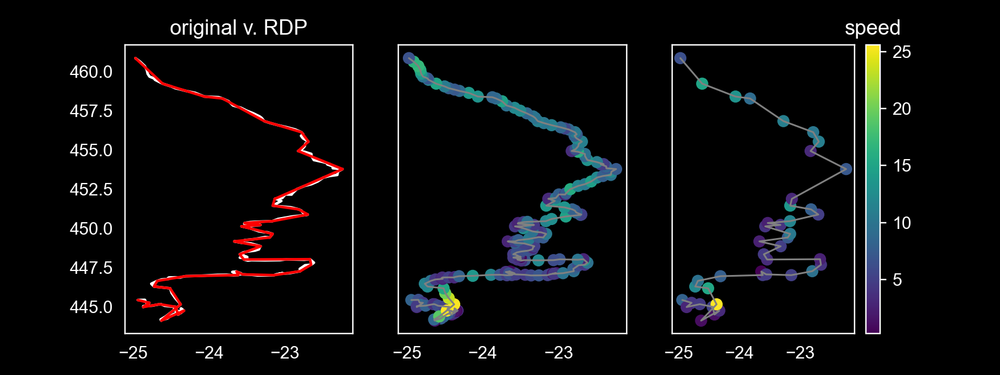

<IPython.core.display.Javascript object>


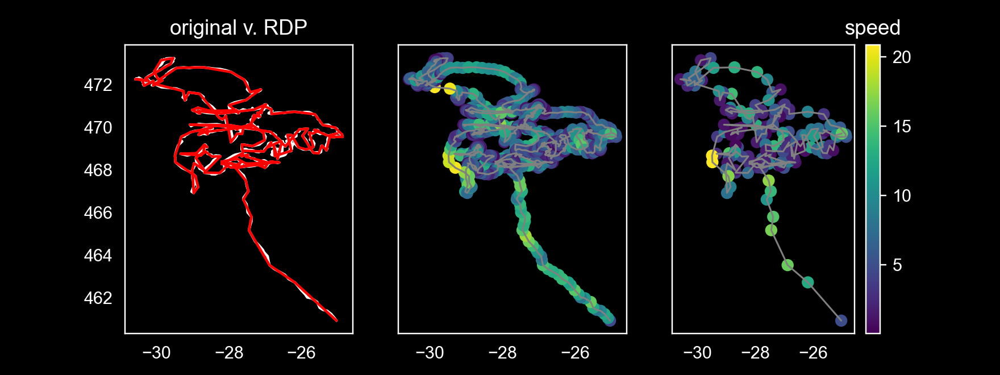

<IPython.core.display.Javascript object>


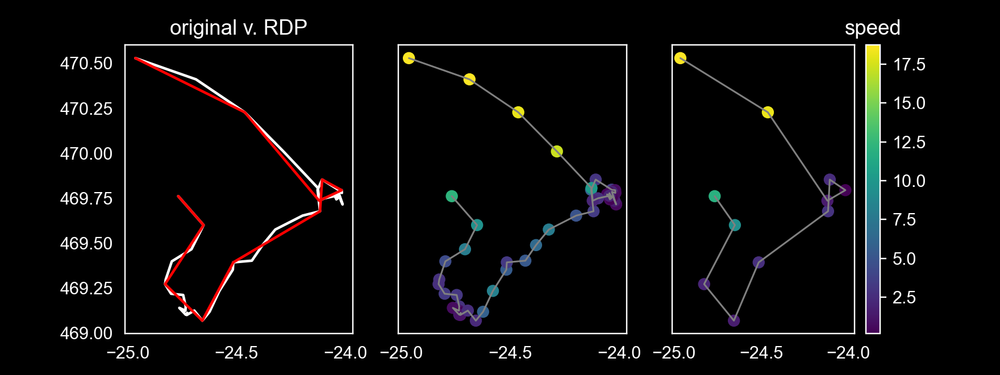

<IPython.core.display.Javascript object>


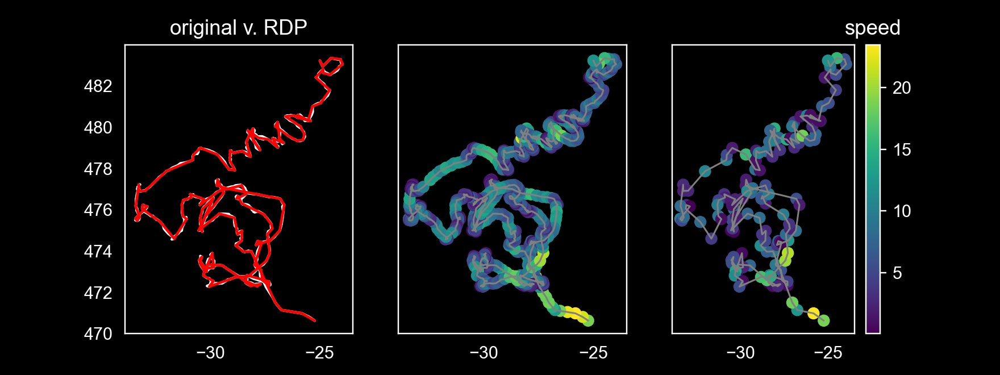

<IPython.core.display.Javascript object>


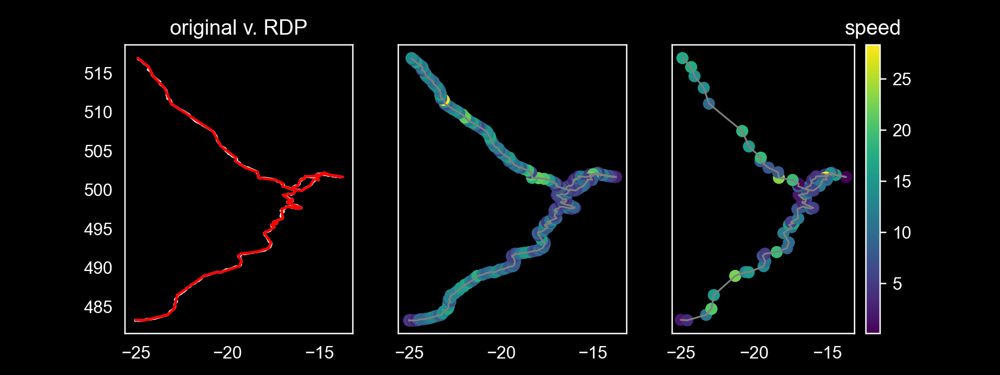

<IPython.core.display.Javascript object>


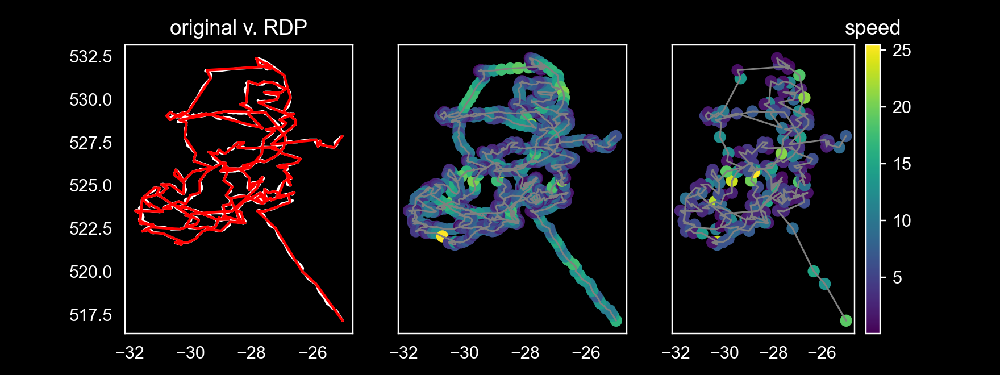

<IPython.core.display.Javascript object>


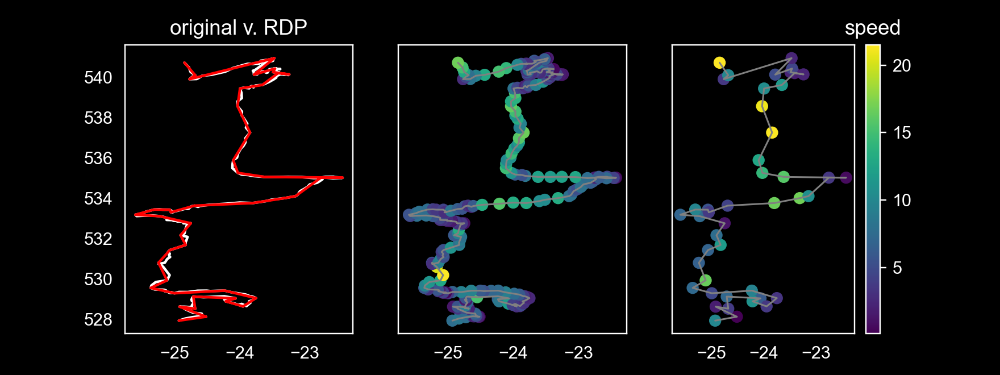

<IPython.core.display.Javascript object>


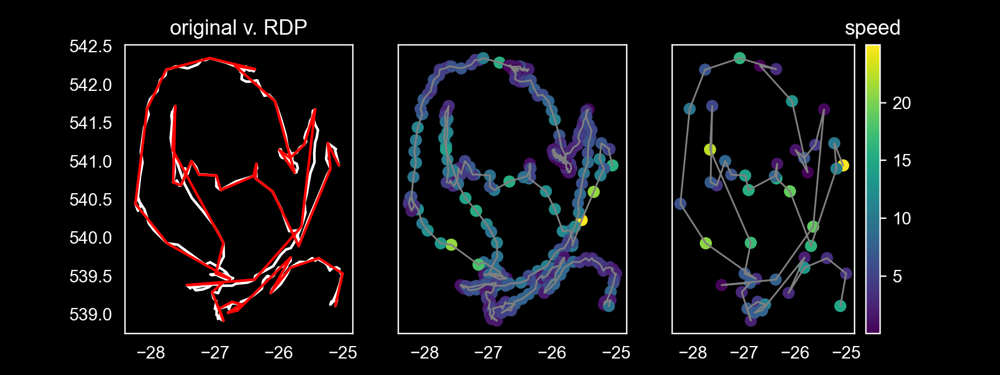

<IPython.core.display.Javascript object>


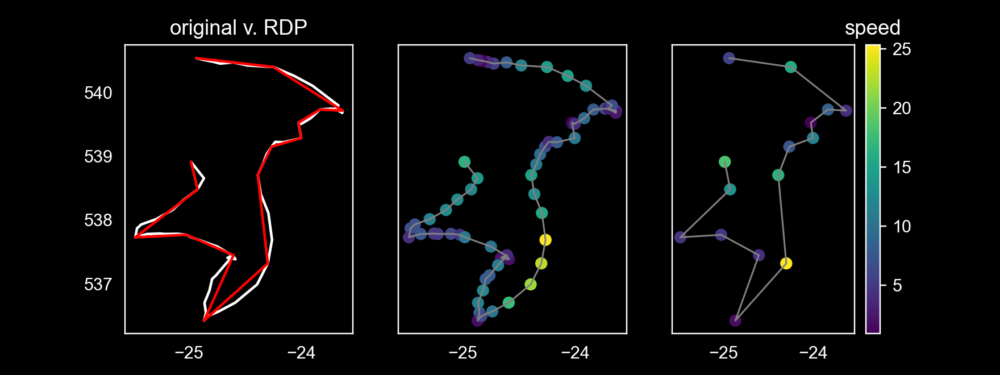

<IPython.core.display.Javascript object>


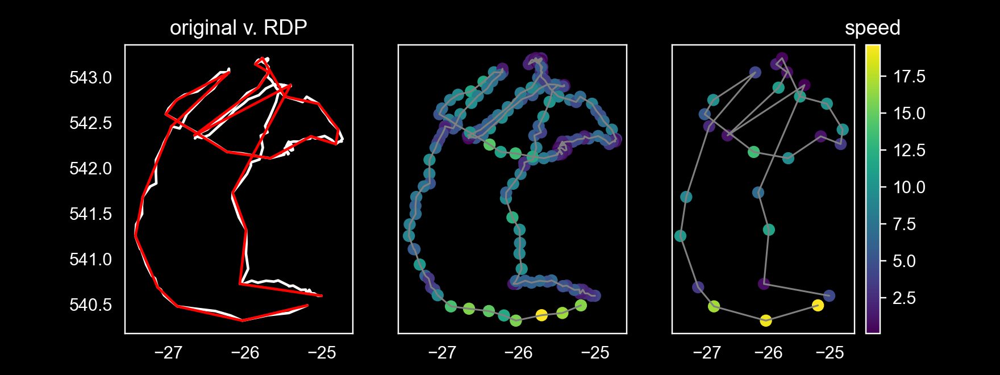

<IPython.core.display.Javascript object>


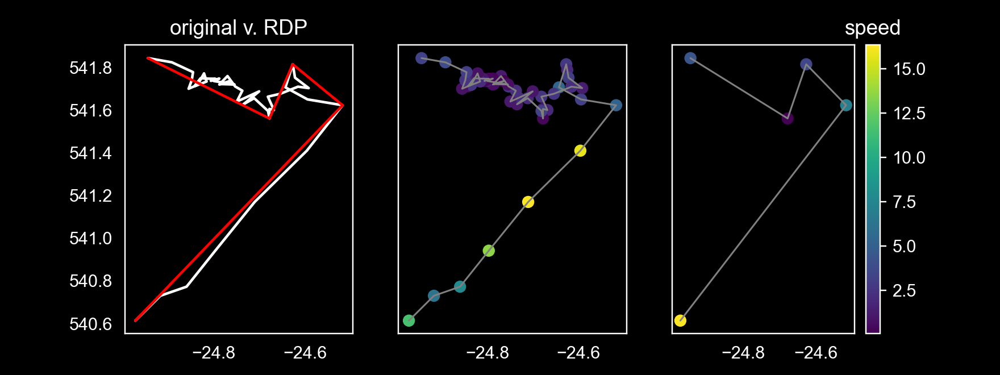

In [900]:
speed_cmap='viridis'
for bnum in np.arange(1, 20):
    b_ = df_[(df_['condition']=='odor') & (df_['boutnum']==bnum)].copy()
    fig = compare_and_plot_rdp_hue(b_, hue_var='speed', cmap=speed_cmap)
    fig.suptitle('')
# speed_min, speed_max = b_['speed'].min(), b_['speed'].max()


In [726]:
b_[b_['rdp_posx']]['speed']

311182    0.862322
311188    0.490161
311191    0.457053
311200    0.945444
311228    3.367967
Name: speed, dtype: float64

In [568]:
df_['rdp_posx'] = None
df_['rdp_posy'] = None
dlist=[]
for c, c_ in df_.groupby('condition'):
    simp = rdp.rdp(c_[['ft_posx', 'ft_posy']].values, epsilon=1)
    df_ = pd.DataFrame({
         'rdp_posx': simp[:, 0], 
         'rdp_posy': simp[:, 1],
         'fly_id': fly_id,
         'condition': c
     })
    print(c, df_.shape)
    dlist.append(df_)
    #df_.loc[c_.index, 'rdp_posy'] = simp[:, 1]

odor (985, 4)
reinforced (417, 4)


In [572]:
simp = pd.concat(dlist, axis=0)

<IPython.core.display.Javascript object>


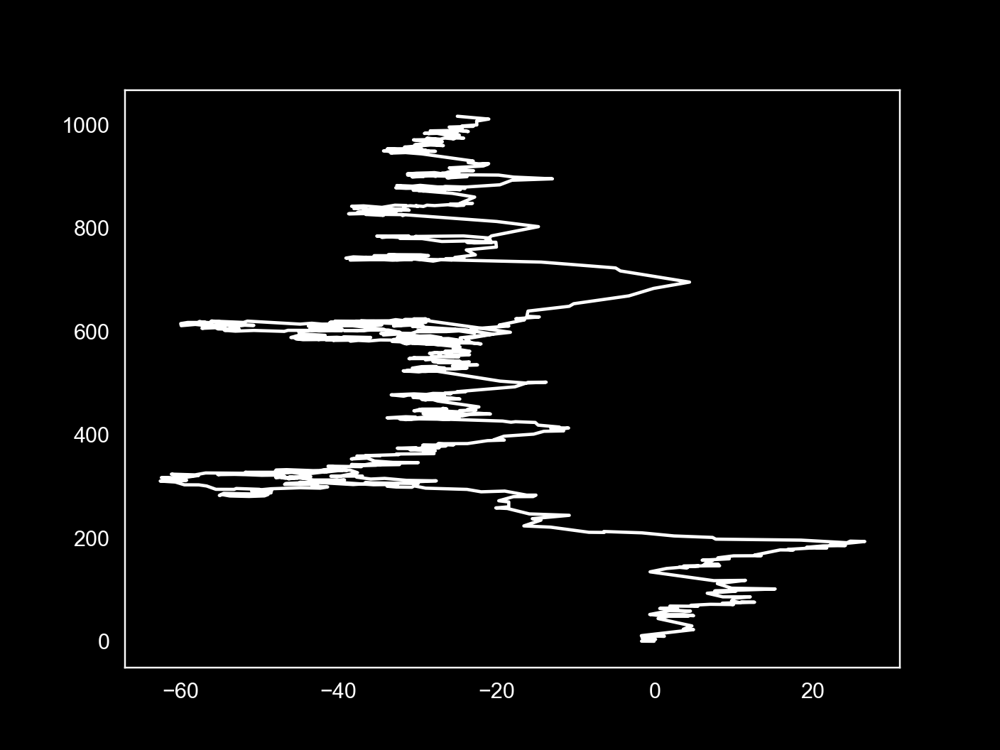

In [593]:
fig, ax = pl.subplots()
# ax.plot(simp[simp['condition']=='odor']['rdp_posx'], simp[simp['condition']=='odor']['rdp_posy'], color='w')
sns

<IPython.core.display.Javascript object>


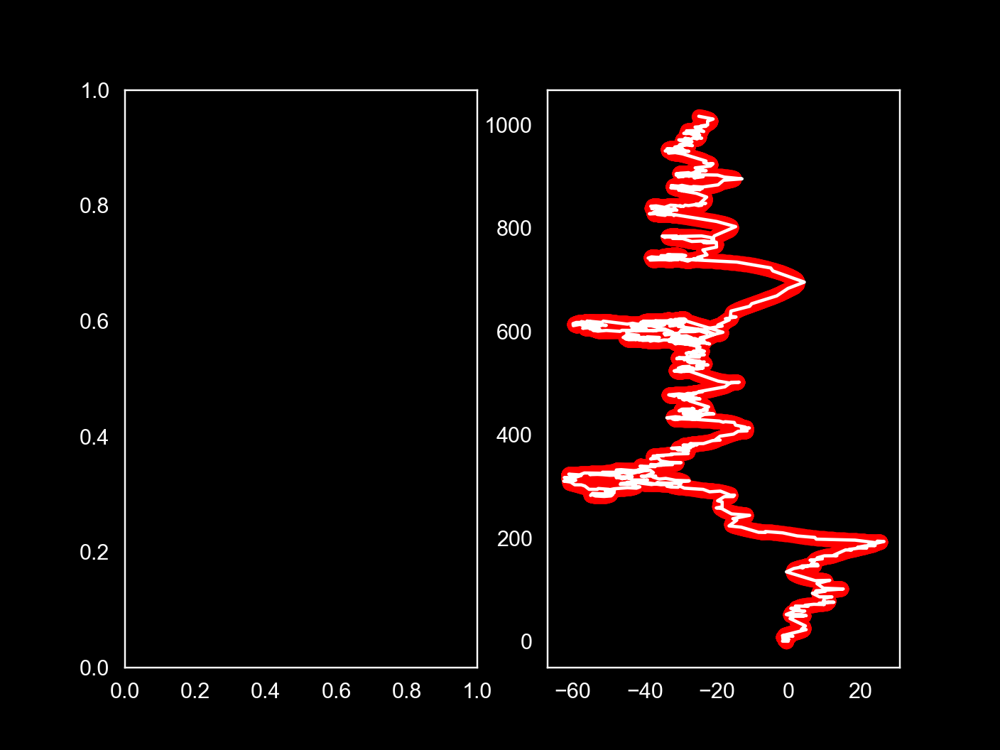

In [606]:
fig, axes = pl.subplots(1, 2)
ax=axes[1]

ax.scatter(df_[df_['condition']=='odor'][xvar], 
        df_[df_['condition']=='odor'][yvar], color='r')
ax.plot(simp[simp['condition']=='odor']['rdp_posx'], 
        simp[simp['condition']=='odor']['rdp_posy'], color='w') # scale=0.1)#,

#                      s=5, legend=True, alpha=0.8, edgecolor='none')
#sns.lineplot(data=simp, x='rdp_posx', y='rdp_posy', ax=ax, color='w')
#                      s=5, legend=True, alpha=0.8, edgecolor='none')
# ax=axes[1]
# sns.scatterplot(data=df_, x=xvar, y=yvar, hue='turn_angle_deg', ax=ax,
#                      s=5, legend=True, alpha=0.8, edgecolor='none', palette='hsv')

<IPython.core.display.Javascript object>


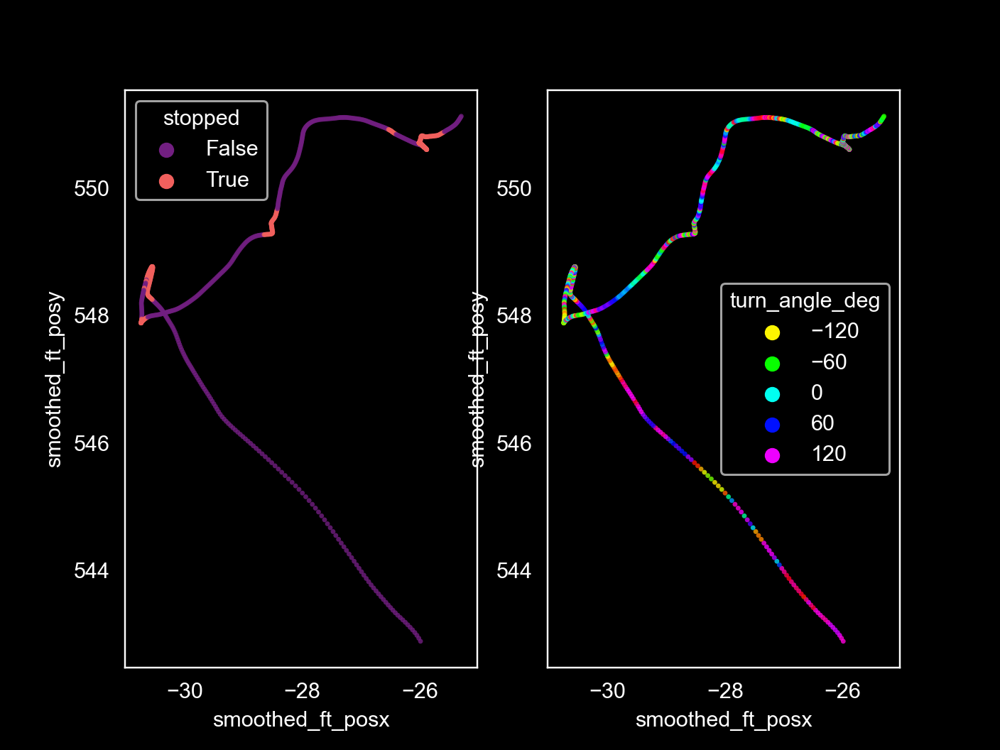

<AxesSubplot: xlabel='smoothed_ft_posx', ylabel='smoothed_ft_posy'>

In [551]:
fig, axes = pl.subplots(1, 2)
ax=axes[0]
sns.scatterplot(data=df_, x=xvar, y=yvar, hue='stopped', ax=ax,
                     s=5, legend=True, alpha=0.8, edgecolor='none', palette='magma')
ax=axes[1]
sns.scatterplot(data=df_, x=xvar, y=yvar, hue='turn_angle_deg', ax=ax,
                     s=5, legend=True, alpha=0.8, edgecolor='none', palette='hsv')

<IPython.core.display.Javascript object>


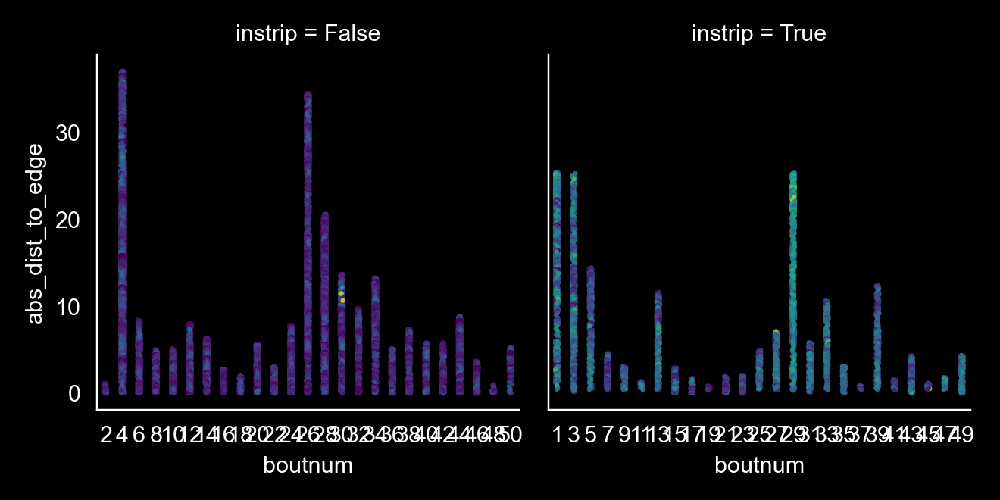

In [1463]:
# df = DF[(DF['fly_id']==fly_id) & (DF['condition']=='odor')].copy()
# df['abs_dist_to_edge'] = abs( abs(df['ft_posx']) - odor_xmax)

#fig, axes = pl.subplots(1,2)
g=sns.FacetGrid(data=df, col='instrip', row='condition', sharex=False, sharey=True)
g.map_dataframe(sns.stripplot, x='boutnum', y='abs_dist_to_edge', hue='speed',
                 s=2, legend=False, alpha=0.8, palette='viridis', jitter=True)
                
                
# for b, b_ in df[~df['instrip']].groupby(['boutnum']):
#     b_['ix_in_bout'] = np.arange(0, b_.shape[0])
#     #ax=axes[0]
#     sns.stripplot(x=b, y='abs_dist_to_edge', hue='ix_in_bout', data=b_, ax=ax,
#                  s=2, legend=False, alpha=0.6, jitter=True)

<IPython.core.display.Javascript object>


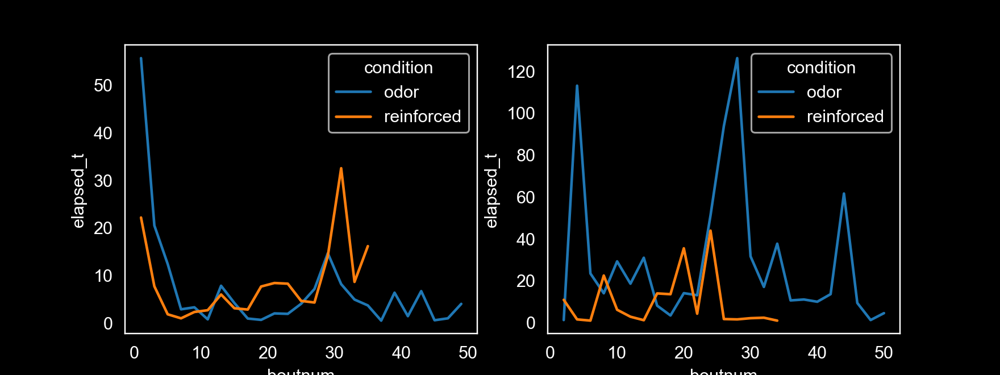

<AxesSubplot: xlabel='boutnum', ylabel='elapsed_t'>

In [882]:
fig, axes = pl.subplots(1, 2, figsize=(8,3))
ax=axes[0]
sns.lineplot(data=df_[df_['instrip']], x='boutnum', y='elapsed_t', ax=ax, hue='condition')
ax=axes[1]
sns.lineplot(data=df_[~df_['instrip']], x='boutnum', y='elapsed_t', ax=ax, hue='condition')
